<a href="https://colab.research.google.com/github/glombardo/Research/blob/main/LDA_plus_Kamada_Kawai_Network_Modeling.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip uninstall -y numpy thinc
!pip install numpy==1.24.4
!pip install -q gensim==4.3.1 pyLDAvis==3.4.1 nltk==3.8.1 matplotlib==3.7.1 wordcloud==1.9.3

In [ ]:
!pip install -q gensim pyLDAvis nltk matplotlib wordcloud

In [ ]:
!pip install networkx==2.8.8 matplotlib==3.7.1 -q

In [ ]:
import pandas as pd
import numpy as np
import re
import nltk
import matplotlib.pyplot as plt
import pyLDAvis
import pyLDAvis.gensim_models as gensimvis
from nltk.corpus import stopwords
from gensim import corpora, models
from wordcloud import WordCloud
import matplotlib.cm as cm
import matplotlib.colors as mcolors
import networkx as nx
from matplotlib import cm
from matplotlib.colors import Normalize
from collections import defaultdict

nltk.download('stopwords')

In [8]:
from google.colab import drive

drive.mount('/content/drive/')
file_path = '/content/drive/MyDrive/dataprojects/network_lda_reddit_data.csv'

import os
if os.path.exists(file_path):
  df = pd.read_csv(file_path)
  # Display the first few rows to verify
  print(df.head())
else:
  print(f"File not found at: {file_path}")

pd_combined = df

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).
              author                                              title  \
0        ThriftShark  For Aussie's importing goods - many are exempt...   
1         progress18  Trump is caught lying about his China tariff p...   
2  NorthernJewellers              Real Liberalism vs Facade Liberalites   
3         Secularizt                                                NaN   
4  NorthernJewellers                                                NaN   

   score      id      subreddit  \
0    8.0  3byfc2  smallbusiness   
1    6.0  417pds        Liberal   
2    0.0  4qb4rt        Liberal   
3    NaN  4qb4rt            NaN   
4    NaN  4qb4rt            NaN   

                                                 url  num_comments  \
0  https://www.reddit.com/r/smallbusiness/comment...           7.0   
1  http://qz.com/595618/trump-is-caught-lying-abo...           2.0 

In [10]:
# Ensure 'created' is in datetime format and extract year
pd_combined['created'] = pd.to_datetime(pd_combined['created'], errors='coerce')
pd_combined['year'] = pd_combined['created'].dt.year

# 1. Overall statistics
overall_stats = {
    "Total Parsed Comments (Rows)": len(pd_combined),
    "Total Posts (Unique IDs)": pd_combined['id'].nunique(),
    "Total Comments (Sum of num_comments)": pd_combined['num_comments'].sum()
}
overall_df = pd.DataFrame.from_dict(overall_stats, orient='index', columns=["Value"])

# 2. Statistics per subreddit
subreddit_df = pd_combined.groupby('subreddit').agg(
    Parsed_Comments=('id', 'count'),
    Unique_Posts=('id', 'nunique'),
    Total_Comments=('num_comments', 'sum')
).sort_values(by='Parsed_Comments', ascending=False).reset_index()

# 3. Statistics per year
year_df = pd_combined.groupby('year').agg(
    Parsed_Comments=('id', 'count'),
    Unique_Posts=('id', 'nunique'),
    Total_Comments=('num_comments', 'sum')
).sort_index().reset_index()

# 4. Top authors by number of posts
top_authors_df = pd_combined['author'].value_counts().head(10).reset_index()
top_authors_df.columns = ['Author', 'Number_of_Posts']

# Show the tables
from IPython.display import display
display(overall_df.style.set_caption("Overall Summary"))
display(subreddit_df.style.set_caption("Summary by Subreddit"))
display(year_df.style.set_caption("Summary by Year"))
display(top_authors_df.style.set_caption("Top Authors by Number of Posts"))


,Value
Total Parsed Comments (Rows),14390.000000
Total Posts (Unique IDs),2661.000000
Total Comments (Sum of num_comments),854589.000000


,subreddit,Parsed_Comments,Unique_Posts,Total_Comments
0,politics,249,249,189207.000000
1,StockMarket,248,248,83632.000000
2,AskEconomics,246,246,9010.000000
3,Economics,246,246,64109.000000
4,AskReddit,245,245,73400.000000
5,Conservative,245,245,81391.000000
6,investing,244,244,56821.000000
7,smallbusiness,241,241,9671.000000
8,wallstreetbets,238,238,222734.000000
9,Askpolitics,218,218,59680.000000


,year,Parsed_Comments,Unique_Posts,Total_Comments
0,2015,1,1,7.000000
1,2016,248,3,247.000000
2,2017,897,4,907.000000
3,2018,10649,63,13189.000000
4,2019,73,73,31415.000000
5,2020,25,25,7094.000000
6,2021,15,15,1190.000000
7,2022,16,15,1828.000000
8,2023,12,12,932.000000
9,2024,274,274,103169.000000


,Author,Number_of_Posts
0,MasterCookSwag,65
1,cuteman,47
2,porncrank,45
3,Nonethewiserer,40
4,Gentlescholar_AMA,39
5,BothZookeepergame612,34
6,According-Activity87,32
7,ObservationalHumor,30
8,sordfysh,29
9,Tasgall,29


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.



🧾 Topics for: All Subreddits
Topic 1: 0.726*"nan" + 0.001*"snapped" + 0.000*"greene" + 0.000*"marjorie" + 0.000*"taylor" + 0.000*"tanked" + 0.000*"dangling" + 0.000*"proposaland" + 0.000*"surcharges" + 0.000*"welp"
Topic 2: 0.054*"tariffs" + 0.030*"trade" + 0.022*"canada" + 0.020*"says" + 0.013*"war" + 0.012*"deal" + 0.007*"mexico" + 0.007*"goods" + 0.006*"exports" + 0.005*"countries"
Topic 3: 0.023*"tariffs" + 0.010*"would" + 0.009*"business" + 0.008*"chinese" + 0.008*"going" + 0.007*"price" + 0.007*"goods" + 0.007*"know" + 0.006*"like" + 0.005*"small"
Topic 4: 0.026*"tariffs" + 0.010*"market" + 0.009*"trumps" + 0.005*"like" + 0.005*"could" + 0.005*"economy" + 0.005*"think" + 0.005*"inflation" + 0.004*"economic" + 0.004*"year"
Topic 5: 0.023*"usca" + 0.012*"etf" + 0.008*"volvo" + 0.008*"soundhound" + 0.006*"amelia" + 0.005*"wendys" + 0.004*"honda" + 0.004*"nvidia" + 0.004*"soundhounds" + 0.004*"tesla"


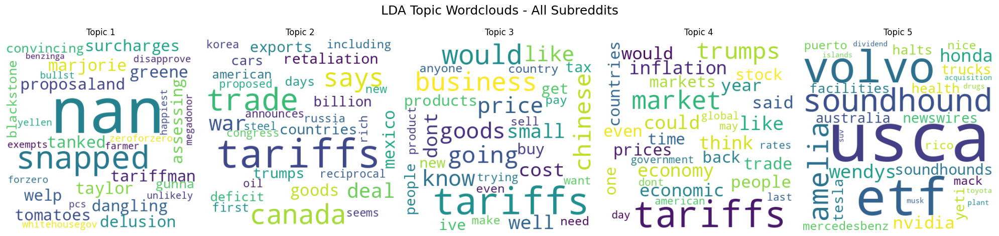


🧾 Topics for: smallbusiness
Topic 1: 0.015*"tariffs" + 0.015*"business" + 0.007*"cost" + 0.007*"year" + 0.006*"going" + 0.006*"price" + 0.006*"prices" + 0.005*"ive" + 0.005*"new" + 0.005*"small"
Topic 2: 0.009*"like" + 0.008*"would" + 0.008*"business" + 0.006*"tariffs" + 0.006*"get" + 0.005*"want" + 0.004*"new" + 0.004*"products" + 0.004*"small" + 0.004*"sell"
Topic 3: 0.018*"business" + 0.015*"tariffs" + 0.010*"small" + 0.006*"would" + 0.005*"goods" + 0.005*"help" + 0.005*"pay" + 0.005*"new" + 0.005*"get" + 0.005*"businesses"
Topic 4: 0.022*"tariffs" + 0.008*"business" + 0.006*"small" + 0.005*"see" + 0.005*"like" + 0.005*"one" + 0.005*"goods" + 0.005*"new" + 0.004*"product" + 0.004*"people"
Topic 5: 0.014*"would" + 0.006*"tariffs" + 0.006*"shipping" + 0.006*"business" + 0.005*"know" + 0.005*"time" + 0.004*"company" + 0.004*"problem" + 0.003*"pay" + 0.003*"first"


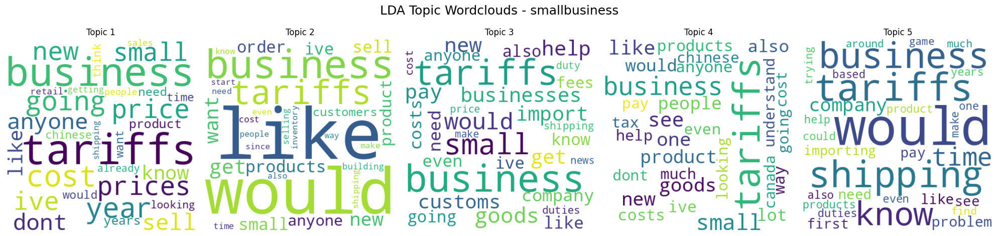


🧾 Topics for: Liberal
Topic 1: 0.013*"vote" + 0.010*"would" + 0.007*"tariffs" + 0.006*"people" + 0.006*"want" + 0.005*"like" + 0.005*"enough" + 0.005*"increase" + 0.004*"dont" + 0.004*"war"
Topic 2: 0.029*"tariffs" + 0.014*"trade" + 0.008*"american" + 0.006*"prices" + 0.006*"canada" + 0.006*"americans" + 0.005*"going" + 0.005*"trumps" + 0.005*"goods" + 0.004*"pay"
Topic 3: 0.011*"crude" + 0.010*"news" + 0.010*"tariffs" + 0.009*"gas" + 0.008*"oil" + 0.006*"hes" + 0.006*"fox" + 0.006*"natural" + 0.006*"buy" + 0.006*"convert"
Topic 4: 0.007*"people" + 0.006*"dont" + 0.006*"tariffs" + 0.006*"get" + 0.005*"know" + 0.005*"right" + 0.005*"like" + 0.005*"going" + 0.004*"hes" + 0.004*"one"
Topic 5: 0.023*"tariffs" + 0.010*"people" + 0.007*"american" + 0.007*"war" + 0.006*"canada" + 0.006*"one" + 0.006*"ontario" + 0.005*"prices" + 0.005*"trade" + 0.005*"make"


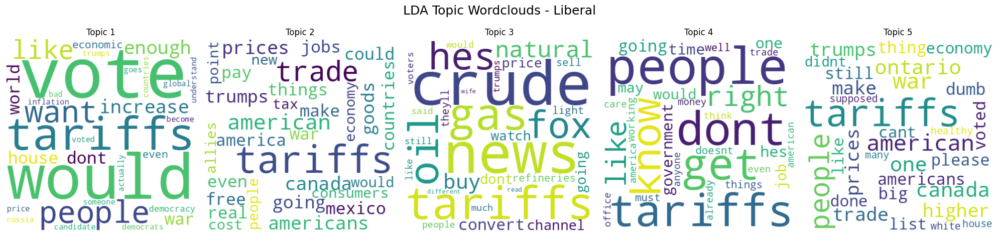

Skipped: nan (no valid text)

🧾 Topics for: investing
Topic 1: 0.014*"tariffs" + 0.012*"tesla" + 0.010*"elon" + 0.007*"going" + 0.006*"stock" + 0.006*"people" + 0.006*"like" + 0.005*"teslas" + 0.004*"markets" + 0.004*"company"
Topic 2: 0.012*"tariffs" + 0.010*"market" + 0.008*"trade" + 0.007*"etf" + 0.006*"year" + 0.006*"bond" + 0.005*"time" + 0.004*"stock" + 0.004*"would" + 0.004*"yield"
Topic 3: 0.016*"tariffs" + 0.009*"market" + 0.005*"percent" + 0.005*"growth" + 0.005*"like" + 0.004*"could" + 0.004*"buy" + 0.004*"would" + 0.004*"chinese" + 0.004*"said"
Topic 4: 0.023*"tariffs" + 0.007*"market" + 0.006*"said" + 0.006*"goods" + 0.005*"shitty" + 0.005*"new" + 0.004*"billion" + 0.004*"chinese" + 0.004*"trade" + 0.004*"including"
Topic 5: 0.027*"tariffs" + 0.007*"goods" + 0.007*"market" + 0.006*"would" + 0.006*"trade" + 0.005*"inflation" + 0.004*"also" + 0.004*"canada" + 0.004*"money" + 0.004*"think"


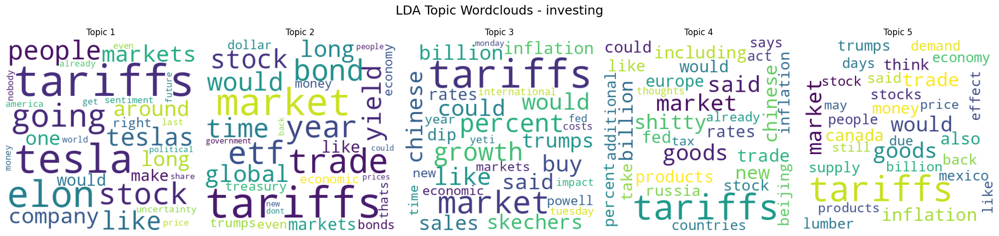


🧾 Topics for: wallstreetbets
Topic 1: 0.018*"tariffs" + 0.010*"market" + 0.004*"could" + 0.004*"walmart" + 0.004*"year" + 0.004*"trumps" + 0.004*"think" + 0.003*"would" + 0.003*"already" + 0.003*"trade"
Topic 2: 0.022*"tariffs" + 0.005*"april" + 0.005*"trade" + 0.005*"going" + 0.004*"year" + 0.004*"week" + 0.004*"countries" + 0.004*"get" + 0.003*"market" + 0.003*"said"
Topic 3: 0.014*"revenue" + 0.012*"soundhound" + 0.009*"amelia" + 0.008*"nvidia" + 0.007*"newswires" + 0.006*"soundhounds" + 0.005*"business" + 0.004*"much" + 0.004*"acquisition" + 0.003*"like"
Topic 4: 0.019*"tariffs" + 0.008*"inflation" + 0.007*"said" + 0.006*"goods" + 0.006*"powell" + 0.006*"trade" + 0.005*"fed" + 0.005*"market" + 0.005*"steel" + 0.004*"trumps"
Topic 5: 0.008*"tariffs" + 0.006*"tesla" + 0.005*"trade" + 0.005*"market" + 0.004*"actually" + 0.004*"think" + 0.004*"chinese" + 0.004*"like" + 0.003*"american" + 0.003*"dont"


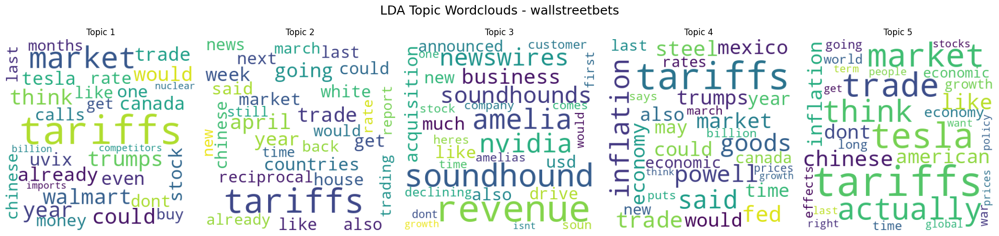


🧾 Topics for: Askpolitics
Topic 1: 0.010*"government" + 0.005*"would" + 0.004*"tariffs" + 0.004*"like" + 0.004*"people" + 0.004*"system" + 0.004*"get" + 0.003*"years" + 0.003*"programs" + 0.003*"trumps"
Topic 2: 0.012*"tariffs" + 0.008*"would" + 0.007*"people" + 0.006*"signed" + 0.006*"trade" + 0.006*"trumps" + 0.005*"canada" + 0.004*"new" + 0.004*"could" + 0.004*"think"
Topic 3: 0.007*"vote" + 0.007*"like" + 0.006*"think" + 0.006*"people" + 0.005*"dont" + 0.005*"tax" + 0.005*"need" + 0.005*"tariffs" + 0.004*"djt" + 0.004*"know"
Topic 4: 0.027*"tariffs" + 0.006*"like" + 0.006*"people" + 0.005*"trumps" + 0.005*"economy" + 0.005*"would" + 0.005*"think" + 0.005*"canada" + 0.004*"could" + 0.004*"also"
Topic 5: 0.030*"tariffs" + 0.008*"people" + 0.008*"countries" + 0.005*"going" + 0.005*"like" + 0.005*"trade" + 0.004*"american" + 0.004*"companies" + 0.004*"even" + 0.004*"costs"


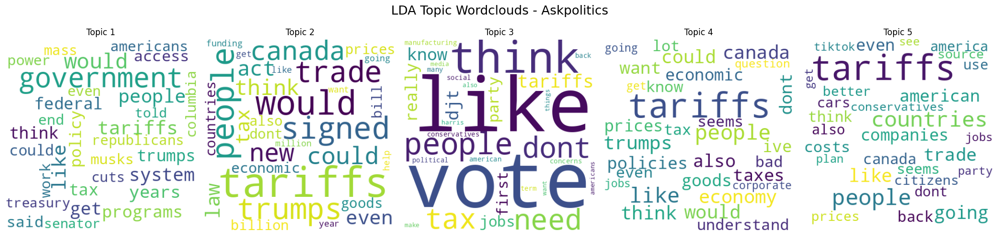


🧾 Topics for: Economics
Topic 1: 0.039*"tariffs" + 0.023*"canada" + 0.020*"says" + 0.012*"trumps" + 0.011*"mexico" + 0.010*"imports" + 0.008*"hits" + 0.008*"hit" + 0.008*"back" + 0.008*"trade"
Topic 2: 0.097*"tariffs" + 0.033*"says" + 0.027*"trumps" + 0.018*"canada" + 0.011*"trade" + 0.011*"mexico" + 0.011*"goods" + 0.009*"could" + 0.009*"house" + 0.008*"back"
Topic 3: 0.059*"tariffs" + 0.011*"imports" + 0.011*"trumps" + 0.009*"chinese" + 0.009*"tax" + 0.008*"new" + 0.008*"rates" + 0.007*"would" + 0.006*"liberation" + 0.006*"day"
Topic 4: 0.042*"tariffs" + 0.013*"america" + 0.009*"says" + 0.007*"wont" + 0.006*"economists" + 0.006*"new" + 0.006*"federal" + 0.006*"market" + 0.006*"stock" + 0.006*"futures"
Topic 5: 0.068*"tariffs" + 0.040*"trumps" + 0.011*"americans" + 0.011*"announces" + 0.009*"prices" + 0.009*"pause" + 0.008*"economy" + 0.008*"goods" + 0.008*"new" + 0.007*"cars"


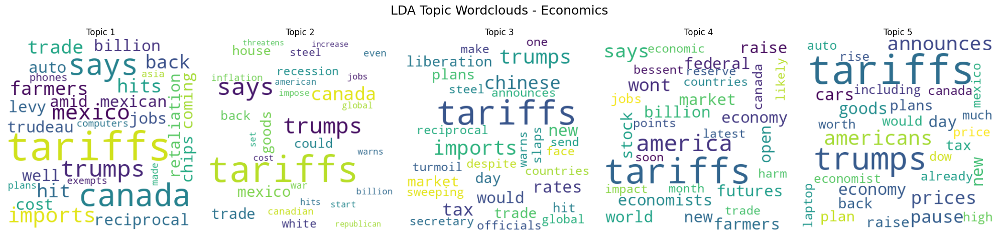


🧾 Topics for: politics
Topic 1: 0.057*"tariffs" + 0.008*"market" + 0.008*"says" + 0.007*"trumps" + 0.005*"admits" + 0.005*"stocks" + 0.005*"markets" + 0.004*"musk" + 0.004*"trading" + 0.004*"ceos"
Topic 2: 0.063*"tariffs" + 0.034*"trumps" + 0.017*"americans" + 0.013*"says" + 0.011*"american" + 0.008*"plan" + 0.008*"would" + 0.006*"prices" + 0.006*"new" + 0.006*"market"
Topic 3: 0.070*"tariffs" + 0.017*"canada" + 0.015*"trumps" + 0.011*"says" + 0.010*"mexico" + 0.008*"stock" + 0.008*"dow" + 0.006*"tax" + 0.006*"market" + 0.006*"house"
Topic 4: 0.045*"tariffs" + 0.020*"trumps" + 0.010*"back" + 0.009*"canada" + 0.007*"open" + 0.005*"war" + 0.005*"musk" + 0.005*"bill" + 0.005*"plans" + 0.005*"house"
Topic 5: 0.049*"tariffs" + 0.036*"trade" + 0.031*"war" + 0.024*"trumps" + 0.012*"says" + 0.009*"thoughts" + 0.009*"second" + 0.009*"house" + 0.008*"white" + 0.007*"higher"


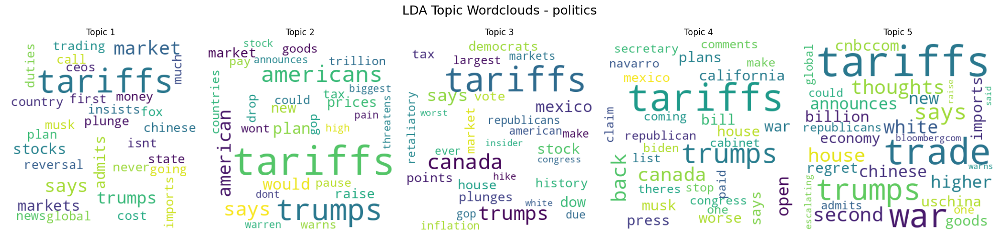


🧾 Topics for: StockMarket
Topic 1: 0.022*"tariffs" + 0.012*"market" + 0.007*"said" + 0.006*"trumps" + 0.005*"going" + 0.005*"trade" + 0.005*"like" + 0.004*"even" + 0.004*"stock" + 0.004*"one"
Topic 2: 0.009*"like" + 0.007*"tariffs" + 0.005*"still" + 0.005*"market" + 0.004*"think" + 0.004*"stock" + 0.004*"hes" + 0.004*"even" + 0.004*"people" + 0.004*"back"
Topic 3: 0.028*"tariffs" + 0.009*"trumps" + 0.008*"trade" + 0.008*"market" + 0.007*"said" + 0.006*"economic" + 0.005*"day" + 0.005*"could" + 0.005*"april" + 0.004*"policy"
Topic 4: 0.018*"tariffs" + 0.009*"trade" + 0.005*"country" + 0.005*"world" + 0.005*"even" + 0.004*"trumps" + 0.004*"countries" + 0.004*"see" + 0.004*"day" + 0.004*"days"
Topic 5: 0.027*"tariffs" + 0.011*"trade" + 0.007*"market" + 0.007*"goods" + 0.006*"countries" + 0.006*"said" + 0.006*"trumps" + 0.005*"would" + 0.005*"like" + 0.005*"economic"


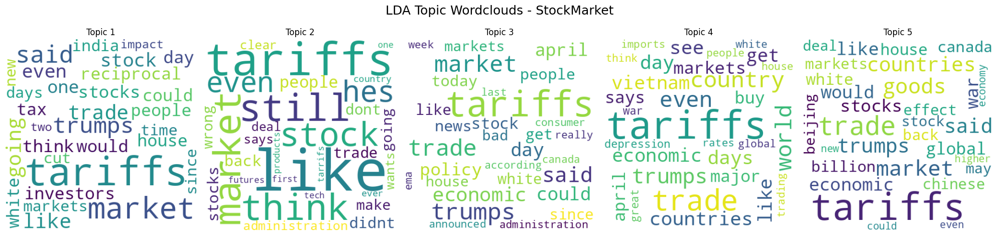


🧾 Topics for: Conservative
Topic 1: 0.041*"tariffs" + 0.017*"canada" + 0.008*"would" + 0.008*"trumps" + 0.007*"mexico" + 0.006*"american" + 0.006*"day" + 0.005*"reciprocal" + 0.005*"dont" + 0.005*"announces"
Topic 2: 0.017*"tariffs" + 0.013*"trumps" + 0.008*"cut" + 0.008*"deal" + 0.007*"says" + 0.007*"ontario" + 0.007*"premier" + 0.006*"aluminum" + 0.006*"steel" + 0.006*"electricity"
Topic 3: 0.030*"tariffs" + 0.010*"trumps" + 0.010*"countries" + 0.006*"mexico" + 0.006*"usa" + 0.006*"says" + 0.006*"imports" + 0.006*"like" + 0.006*"globalism" + 0.006*"canada"
Topic 4: 0.057*"tariffs" + 0.016*"trumps" + 0.012*"canada" + 0.010*"says" + 0.009*"mexico" + 0.007*"manufacturing" + 0.007*"trade" + 0.007*"war" + 0.005*"dont" + 0.005*"new"
Topic 5: 0.031*"tariffs" + 0.011*"think" + 0.007*"things" + 0.007*"time" + 0.006*"might" + 0.006*"country" + 0.006*"understand" + 0.006*"dont" + 0.005*"answer" + 0.005*"people"


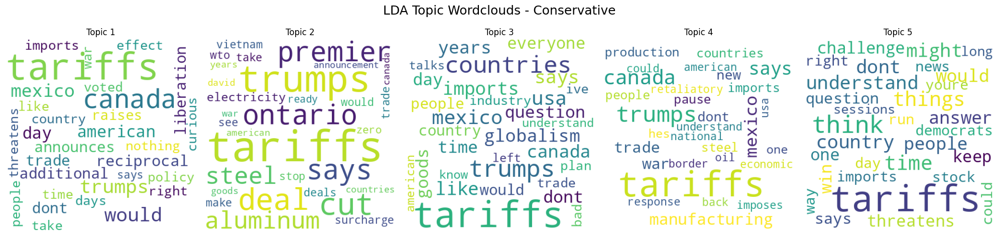


🧾 Topics for: AskReddit
Topic 1: 0.039*"tariffs" + 0.015*"buy" + 0.015*"trumps" + 0.011*"whats" + 0.011*"americans" + 0.011*"tax" + 0.011*"business" + 0.008*"benefit" + 0.008*"question" + 0.008*"feel"
Topic 2: 0.117*"tariffs" + 0.035*"think" + 0.023*"trumps" + 0.017*"feel" + 0.013*"new" + 0.013*"americans" + 0.011*"usa" + 0.010*"economy" + 0.009*"countries" + 0.009*"thoughts"
Topic 3: 0.065*"tariffs" + 0.026*"would" + 0.016*"americans" + 0.013*"trumps" + 0.013*"think" + 0.012*"feel" + 0.010*"stock" + 0.010*"market" + 0.008*"manufacturing" + 0.008*"country"
Topic 4: 0.066*"tariffs" + 0.024*"whats" + 0.019*"trumps" + 0.014*"americans" + 0.014*"war" + 0.011*"opinion" + 0.009*"government" + 0.009*"going" + 0.007*"imposed" + 0.007*"current"
Topic 5: 0.043*"tariffs" + 0.015*"put" + 0.009*"thoughts" + 0.009*"possible" + 0.009*"think" + 0.009*"wants" + 0.009*"war" + 0.009*"countries" + 0.006*"canada" + 0.006*"days"


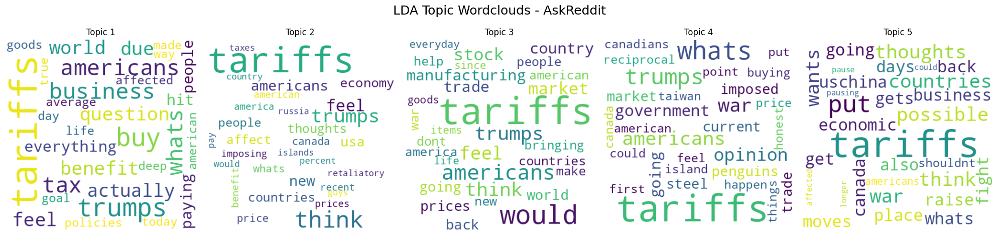


🧾 Topics for: AskEconomics
Topic 1: 0.053*"tariffs" + 0.011*"would" + 0.009*"trumps" + 0.007*"countries" + 0.007*"could" + 0.006*"economy" + 0.006*"prices" + 0.006*"goods" + 0.006*"bad" + 0.005*"like"
Topic 2: 0.047*"tariffs" + 0.018*"would" + 0.016*"goods" + 0.012*"countries" + 0.009*"country" + 0.008*"like" + 0.006*"dont" + 0.006*"increase" + 0.006*"price" + 0.006*"trumps"
Topic 3: 0.036*"tariffs" + 0.007*"would" + 0.006*"manufacturing" + 0.006*"prices" + 0.006*"bad" + 0.005*"trumps" + 0.005*"people" + 0.005*"market" + 0.005*"countries" + 0.004*"economic"
Topic 4: 0.030*"tariffs" + 0.012*"would" + 0.009*"could" + 0.008*"tax" + 0.006*"income" + 0.006*"trade" + 0.006*"manufacturing" + 0.006*"trumps" + 0.006*"think" + 0.005*"economy"
Topic 5: 0.026*"tariffs" + 0.019*"tax" + 0.009*"would" + 0.009*"country" + 0.007*"apple" + 0.006*"make" + 0.006*"usa" + 0.006*"countries" + 0.005*"sales" + 0.005*"way"


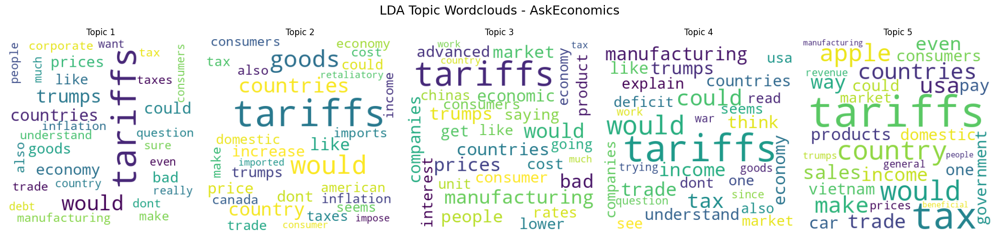


🧾 Topics for: Trumponomics
Topic 1: 0.039*"tariffs" + 0.015*"canada" + 0.009*"mexico" + 0.009*"trumps" + 0.009*"american" + 0.009*"money" + 0.007*"time" + 0.007*"canadian" + 0.006*"back" + 0.006*"month"
Topic 2: 0.043*"tariffs" + 0.011*"trumps" + 0.009*"says" + 0.008*"would" + 0.006*"countries" + 0.006*"market" + 0.006*"care" + 0.006*"work" + 0.006*"paid" + 0.006*"chinese"
Topic 3: 0.027*"tariffs" + 0.014*"trumps" + 0.011*"going" + 0.011*"auto" + 0.009*"economists" + 0.007*"prices" + 0.007*"raise" + 0.007*"americans" + 0.007*"back" + 0.007*"said"
Topic 4: 0.028*"tariffs" + 0.012*"products" + 0.009*"free" + 0.007*"american" + 0.007*"usa" + 0.007*"check" + 0.005*"make" + 0.005*"truth" + 0.005*"lot" + 0.005*"end"
Topic 5: 0.037*"tariffs" + 0.020*"trumps" + 0.011*"economy" + 0.007*"electronics" + 0.007*"says" + 0.007*"dow" + 0.007*"well" + 0.007*"worldwide" + 0.007*"selloff" + 0.007*"drops"


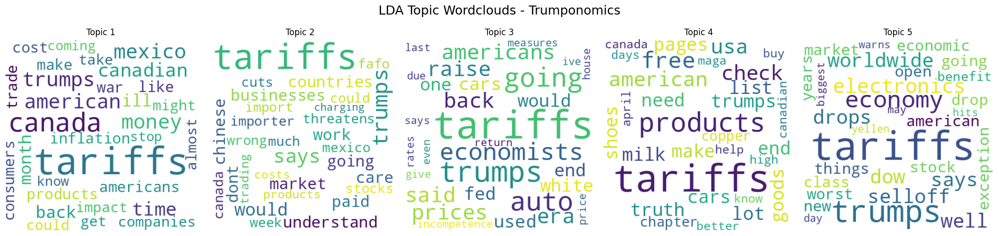


🧾 Topics for: Tariffs
Topic 1: 0.094*"usca" + 0.018*"tariffs" + 0.012*"mercedesbenz" + 0.010*"toyota" + 0.010*"honda" + 0.010*"suv" + 0.008*"crv" + 0.008*"tesla" + 0.008*"model" + 0.008*"hybrid"
Topic 2: 0.009*"order" + 0.007*"small" + 0.007*"putin" + 0.006*"like" + 0.006*"canada" + 0.006*"price" + 0.006*"another" + 0.006*"would" + 0.004*"imported" + 0.004*"countries"
Topic 3: 0.008*"tariffs" + 0.008*"products" + 0.008*"countries" + 0.006*"like" + 0.006*"business" + 0.006*"easy" + 0.004*"going" + 0.004*"way" + 0.004*"superbowl" + 0.004*"import"
Topic 4: 0.016*"tariffs" + 0.010*"canada" + 0.007*"people" + 0.006*"get" + 0.006*"american" + 0.006*"know" + 0.005*"like" + 0.005*"together" + 0.005*"economics" + 0.004*"trumps"
Topic 5: 0.025*"tariffs" + 0.012*"trade" + 0.011*"april" + 0.009*"reciprocal" + 0.009*"subject" + 0.008*"goods" + 0.008*"effective" + 0.008*"new" + 0.008*"additional" + 0.007*"products"


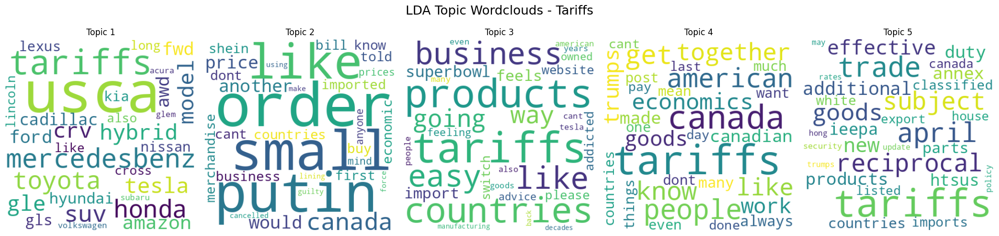

In [ ]:
pd_combined = df
nltk.download('stopwords')

#Define custom stopwords
custom_stopwords = set(stopwords.words('english')).union(set([
    'n','tariff','trump','china','us','good','say','u','s','go','president','donald',
    'united','states','format','png','webp','content','support','reddit'
]))

#Text cleaning function
def preprocess(text):
    text = re.sub(r'http\S+|www\S+|@\S+', '', str(text))
    text = re.sub(r'[^a-zA-Z\s]', '', text)
    tokens = text.lower().split()
    return [word for word in tokens if word not in custom_stopwords and len(word) > 2]

#Apply preprocessing
pd_combined['tokens'] = pd_combined['text'].astype(str).apply(preprocess)

#Define function to run LDA and visualize topics
def lda_and_plot(df, label="Overall"):
    # Filter empty
    df = df[df['tokens'].map(len) > 0]
    if df.empty:
        print(f"Skipped: {label} (no valid text)")
        return

    # Create dictionary & corpus
    dictionary = corpora.Dictionary(df['tokens'])
    corpus = [dictionary.doc2bow(text) for text in df['tokens']]

    # Train LDA
    lda_model = models.LdaModel(corpus=corpus, id2word=dictionary, num_topics=5, random_state=42, passes=10)

    # 🧠 Print top words for each topic
    print(f"\n🧾 Topics for: {label}")
    for idx, topic in lda_model.print_topics(-1):
        print(f"Topic {idx + 1}: {topic}")

    #Generate wordcloud per topic
    fig, axs = plt.subplots(1, 5, figsize=(20, 5))
    fig.suptitle(f"LDA Topic Wordclouds - {label}", fontsize=18)
    for t in range(5):
        topic_words = dict(lda_model.show_topic(t, 30))
        wc = WordCloud(width=400, height=400, background_color='white').generate_from_frequencies(topic_words)
        axs[t].imshow(wc, interpolation='bilinear')
        axs[t].axis('off')
        axs[t].set_title(f"Topic {t + 1}")
    plt.tight_layout()
    plt.show()

    #Interactive LDA visualization
    vis = gensimvis.prepare(lda_model, corpus, dictionary)
    pyLDAvis.display(vis)

#Run LDA for overall dataset
lda_and_plot(pd_combined, label="All Subreddits")

#Run LDA for each subreddit
for sub in pd_combined['subreddit'].unique():
    lda_and_plot(pd_combined[pd_combined['subreddit'] == sub], label=sub)


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!



🧾 Topic summary for: All Subreddits
Topic 1: 0.010*"usca" + 0.009*"reciprocal" + 0.006*"april" + 0.005*"etf" + 0.004*"bessent" + 0.004*"musk" + 0.004*"sunday" + 0.004*"volvo" + 0.003*"soundhound" + 0.003*"progress"
Topic 2: 0.725*"nan" + 0.001*"phoneschips" + 0.001*"exempts" + 0.000*"laughed" + 0.000*"sht" + 0.000*"convincing" + 0.000*"upsetting" + 0.000*"negotiator" + 0.000*"businessesindustries" + 0.000*"transparency"
Topic 3: 0.008*"would" + 0.007*"trade" + 0.006*"like" + 0.006*"people" + 0.005*"goods" + 0.005*"could" + 0.005*"dont" + 0.004*"business" + 0.004*"even" + 0.004*"countries"
Topic 4: 0.014*"think" + 0.012*"actually" + 0.008*"rich" + 0.008*"calls" + 0.006*"pretty" + 0.006*"california" + 0.005*"big" + 0.004*"consumption" + 0.004*"threatens" + 0.004*"shock"
Topic 5: 0.026*"market" + 0.010*"stock" + 0.008*"bond" + 0.007*"year" + 0.007*"stocks" + 0.006*"yield" + 0.006*"back" + 0.006*"yields" + 0.006*"bonds" + 0.005*"last"


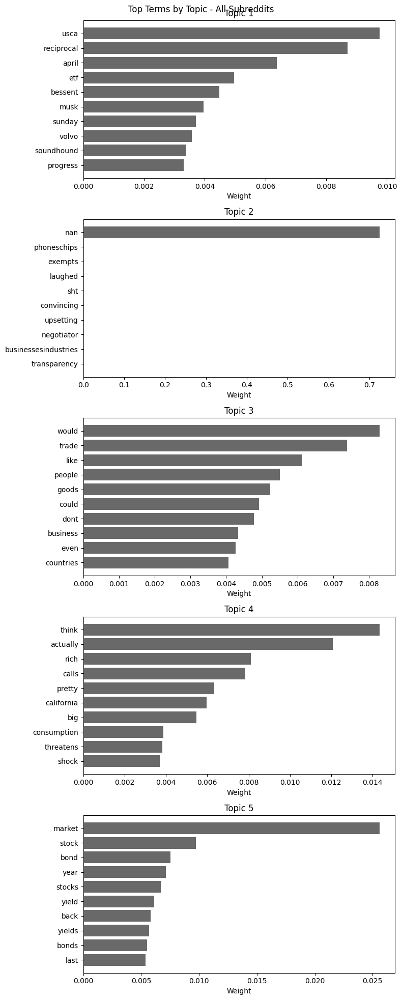


🧾 Topic summary for: smallbusiness
Topic 1: 0.011*"business" + 0.008*"new" + 0.008*"going" + 0.007*"like" + 0.007*"would" + 0.006*"small" + 0.005*"ive" + 0.004*"prices" + 0.004*"get" + 0.004*"know"
Topic 2: 0.013*"business" + 0.008*"cost" + 0.007*"like" + 0.007*"price" + 0.006*"small" + 0.005*"product" + 0.005*"would" + 0.005*"ive" + 0.005*"see" + 0.004*"even"
Topic 3: 0.013*"business" + 0.008*"small" + 0.006*"need" + 0.006*"products" + 0.006*"pay" + 0.006*"like" + 0.005*"would" + 0.005*"get" + 0.005*"company" + 0.005*"importing"
Topic 4: 0.015*"business" + 0.008*"would" + 0.006*"small" + 0.005*"fox" + 0.005*"years" + 0.004*"see" + 0.004*"also" + 0.004*"know" + 0.004*"anyone" + 0.004*"right"
Topic 5: 0.009*"would" + 0.008*"business" + 0.007*"shipping" + 0.005*"need" + 0.005*"help" + 0.005*"small" + 0.005*"trying" + 0.004*"import" + 0.004*"company" + 0.004*"ive"


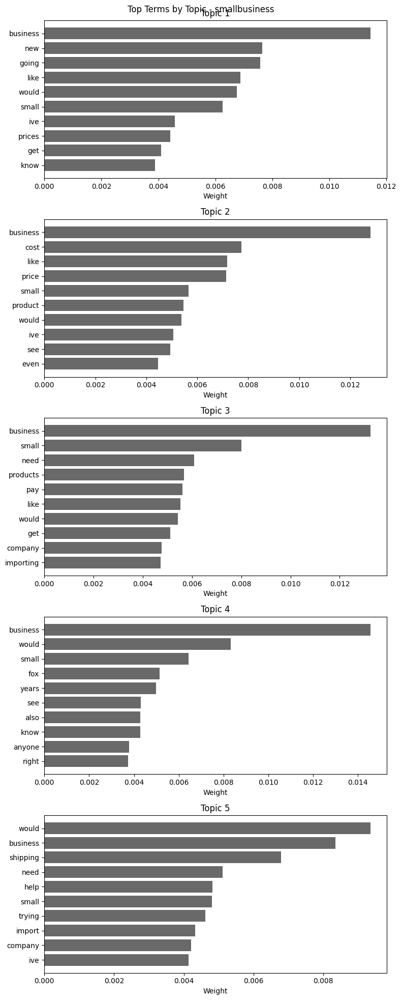


🧾 Topic summary for: Liberal
Topic 1: 0.013*"vote" + 0.013*"gas" + 0.010*"would" + 0.010*"crude" + 0.008*"oil" + 0.007*"want" + 0.007*"price" + 0.006*"going" + 0.006*"prices" + 0.006*"natural"
Topic 2: 0.014*"trade" + 0.010*"american" + 0.006*"people" + 0.006*"canada" + 0.005*"war" + 0.005*"one" + 0.005*"america" + 0.005*"world" + 0.005*"working" + 0.004*"way"
Topic 3: 0.011*"people" + 0.007*"like" + 0.006*"dont" + 0.006*"even" + 0.006*"would" + 0.005*"trade" + 0.004*"war" + 0.004*"news" + 0.004*"american" + 0.004*"one"
Topic 4: 0.010*"like" + 0.008*"going" + 0.006*"dont" + 0.006*"hes" + 0.005*"enough" + 0.005*"things" + 0.005*"trying" + 0.004*"job" + 0.004*"goods" + 0.004*"still"
Topic 5: 0.009*"americans" + 0.007*"prices" + 0.006*"money" + 0.005*"know" + 0.005*"vote" + 0.005*"point" + 0.005*"make" + 0.005*"voted" + 0.004*"even" + 0.004*"trade"


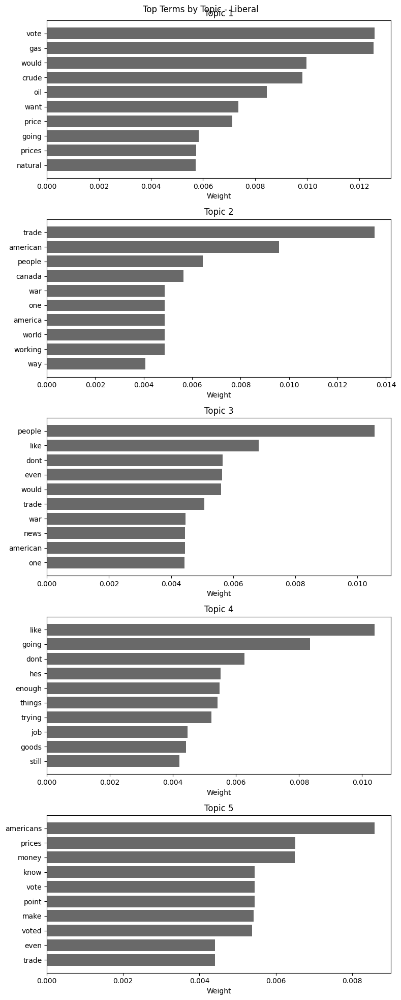

⚠️ Skipped: nan (no valid tokens)

🧾 Topic summary for: investing
Topic 1: 0.009*"market" + 0.007*"money" + 0.006*"would" + 0.005*"like" + 0.005*"trade" + 0.005*"inflation" + 0.005*"goods" + 0.004*"one" + 0.004*"could" + 0.004*"economy"
Topic 2: 0.009*"market" + 0.006*"year" + 0.005*"trade" + 0.005*"yield" + 0.004*"bond" + 0.004*"would" + 0.004*"economic" + 0.004*"long" + 0.004*"said" + 0.004*"bonds"
Topic 3: 0.007*"tesla" + 0.007*"elon" + 0.006*"market" + 0.006*"like" + 0.005*"going" + 0.005*"markets" + 0.005*"would" + 0.005*"trade" + 0.004*"stock" + 0.004*"people"
Topic 4: 0.007*"market" + 0.006*"goods" + 0.005*"canada" + 0.005*"trade" + 0.005*"global" + 0.005*"billion" + 0.004*"said" + 0.004*"imports" + 0.004*"supply" + 0.004*"lumber"
Topic 5: 0.016*"etf" + 0.007*"stock" + 0.005*"recession" + 0.005*"market" + 0.004*"dip" + 0.004*"like" + 0.004*"buy" + 0.004*"percent" + 0.004*"year" + 0.004*"people"


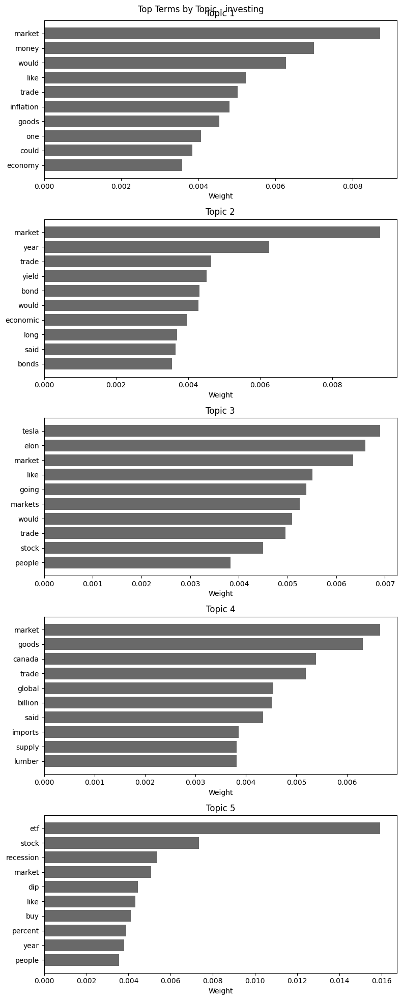


🧾 Topic summary for: wallstreetbets
Topic 1: 0.005*"trade" + 0.004*"imports" + 0.004*"goods" + 0.004*"could" + 0.004*"billion" + 0.003*"chinese" + 0.003*"market" + 0.003*"prices" + 0.003*"canada" + 0.003*"year"
Topic 2: 0.007*"newswires" + 0.006*"trade" + 0.005*"market" + 0.004*"goods" + 0.004*"post" + 0.004*"also" + 0.003*"european" + 0.003*"tech" + 0.003*"usd" + 0.003*"march"
Topic 3: 0.007*"tesla" + 0.006*"market" + 0.005*"last" + 0.005*"walmart" + 0.005*"actually" + 0.005*"year" + 0.004*"like" + 0.004*"trade" + 0.003*"get" + 0.003*"think"
Topic 4: 0.008*"market" + 0.007*"inflation" + 0.006*"said" + 0.005*"could" + 0.005*"trade" + 0.005*"would" + 0.004*"powell" + 0.004*"fed" + 0.004*"think" + 0.004*"rates"
Topic 5: 0.012*"revenue" + 0.011*"soundhound" + 0.008*"amelia" + 0.007*"nvidia" + 0.005*"soundhounds" + 0.005*"steel" + 0.005*"company" + 0.004*"dont" + 0.004*"time" + 0.004*"much"


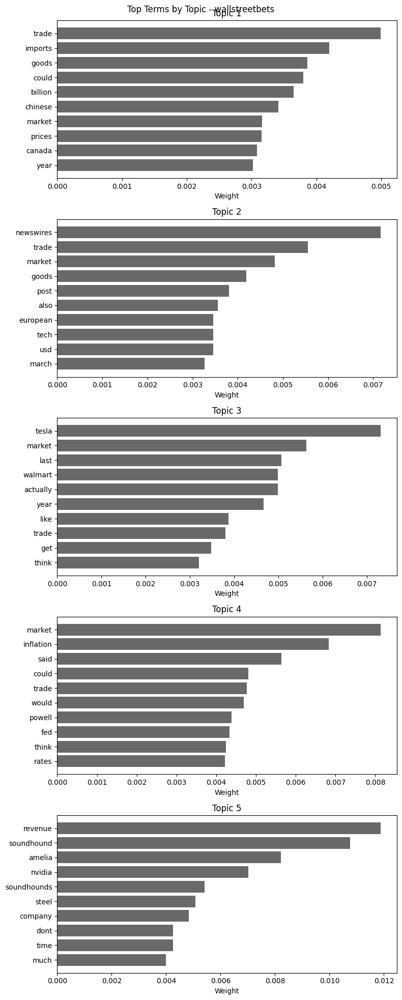


🧾 Topic summary for: Askpolitics
Topic 1: 0.007*"would" + 0.006*"countries" + 0.006*"think" + 0.005*"goods" + 0.005*"vote" + 0.005*"canada" + 0.005*"people" + 0.004*"free" + 0.004*"trade" + 0.004*"party"
Topic 2: 0.011*"people" + 0.006*"think" + 0.005*"like" + 0.005*"would" + 0.005*"get" + 0.005*"going" + 0.005*"dont" + 0.005*"also" + 0.004*"want" + 0.004*"need"
Topic 3: 0.007*"could" + 0.006*"canada" + 0.005*"would" + 0.005*"people" + 0.004*"like" + 0.004*"trade" + 0.004*"know" + 0.004*"even" + 0.004*"something" + 0.004*"manufacturing"
Topic 4: 0.006*"government" + 0.006*"signed" + 0.005*"like" + 0.005*"tax" + 0.004*"people" + 0.004*"americans" + 0.004*"would" + 0.004*"prices" + 0.003*"dont" + 0.003*"american"
Topic 5: 0.006*"people" + 0.005*"like" + 0.005*"taxes" + 0.005*"corporate" + 0.004*"would" + 0.004*"want" + 0.004*"trade" + 0.004*"left" + 0.004*"nations" + 0.004*"tax"


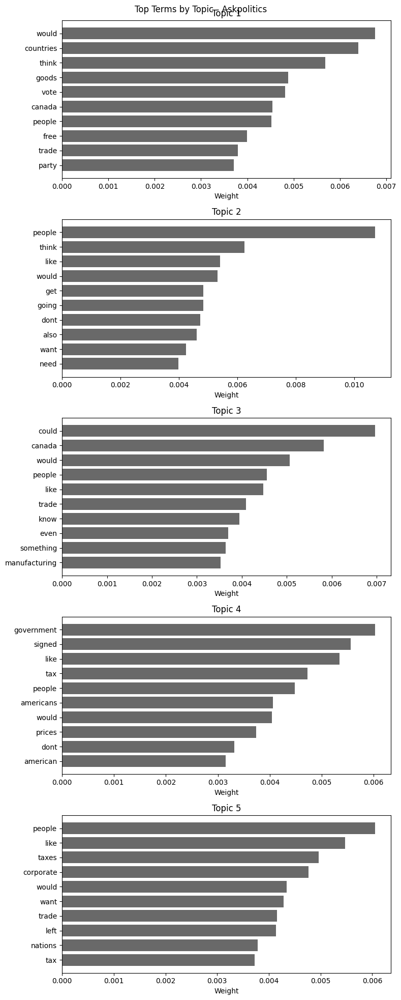


🧾 Topic summary for: Economics
Topic 1: 0.010*"goods" + 0.008*"billion" + 0.008*"americans" + 0.008*"trade" + 0.008*"says" + 0.005*"new" + 0.005*"retaliation" + 0.005*"war" + 0.005*"expect" + 0.005*"plunge"
Topic 2: 0.032*"canada" + 0.032*"says" + 0.018*"mexico" + 0.009*"plans" + 0.009*"imports" + 0.007*"tax" + 0.007*"secretary" + 0.006*"impose" + 0.006*"prices" + 0.006*"steel"
Topic 3: 0.016*"says" + 0.012*"trade" + 0.012*"pause" + 0.010*"reciprocal" + 0.010*"day" + 0.009*"announces" + 0.007*"countries" + 0.007*"new" + 0.007*"jobs" + 0.007*"raise"
Topic 4: 0.015*"says" + 0.012*"house" + 0.012*"slaps" + 0.011*"america" + 0.010*"white" + 0.009*"new" + 0.008*"goods" + 0.006*"steel" + 0.006*"economy" + 0.006*"bring"
Topic 5: 0.016*"back" + 0.016*"could" + 0.014*"recession" + 0.013*"canada" + 0.012*"hits" + 0.012*"says" + 0.010*"hit" + 0.010*"mexico" + 0.008*"imports" + 0.008*"farmers"


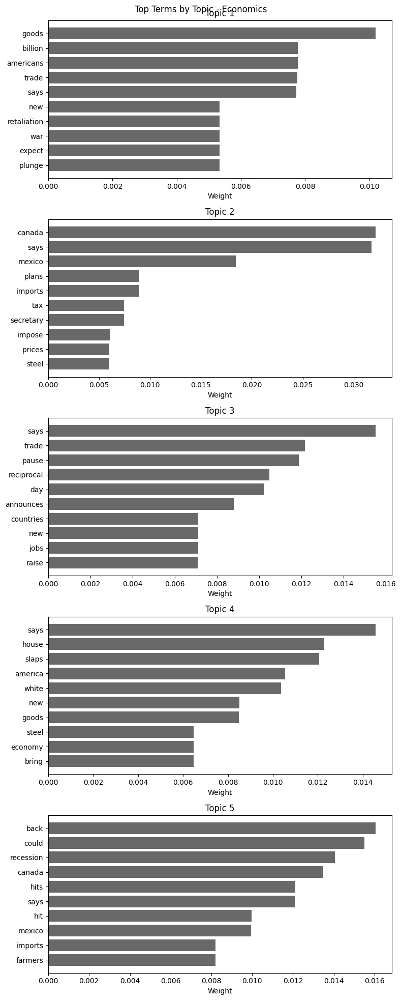


🧾 Topic summary for: politics
Topic 1: 0.009*"says" + 0.008*"market" + 0.008*"canada" + 0.007*"make" + 0.006*"prices" + 0.006*"time" + 0.006*"plan" + 0.006*"stock" + 0.006*"mexico" + 0.005*"gop"
Topic 2: 0.013*"stock" + 0.010*"market" + 0.009*"warns" + 0.009*"biggest" + 0.007*"republicans" + 0.007*"would" + 0.006*"back" + 0.006*"house" + 0.006*"plunges" + 0.006*"says"
Topic 3: 0.013*"canada" + 0.013*"says" + 0.012*"americans" + 0.009*"new" + 0.009*"gop" + 0.006*"wont" + 0.006*"california" + 0.006*"admits" + 0.005*"retaliatory" + 0.005*"plan"
Topic 4: 0.043*"trade" + 0.038*"war" + 0.014*"says" + 0.014*"house" + 0.012*"white" + 0.012*"thoughts" + 0.012*"second" + 0.009*"goods" + 0.008*"chinese" + 0.008*"higher"
Topic 5: 0.013*"says" + 0.011*"mexico" + 0.007*"prices" + 0.007*"raise" + 0.007*"canada" + 0.007*"would" + 0.007*"taxes" + 0.006*"open" + 0.006*"plans" + 0.006*"tax"


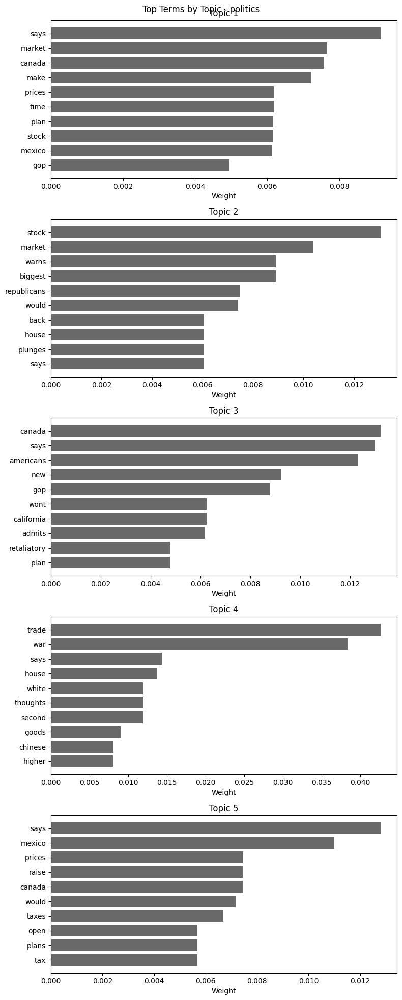


🧾 Topic summary for: StockMarket
Topic 1: 0.010*"trade" + 0.006*"april" + 0.006*"said" + 0.006*"market" + 0.005*"countries" + 0.005*"white" + 0.005*"house" + 0.005*"chinese" + 0.004*"would" + 0.004*"economic"
Topic 2: 0.009*"said" + 0.005*"deal" + 0.005*"trade" + 0.005*"going" + 0.005*"market" + 0.005*"would" + 0.004*"people" + 0.004*"canada" + 0.004*"may" + 0.004*"even"
Topic 3: 0.010*"trade" + 0.007*"said" + 0.006*"economic" + 0.006*"could" + 0.005*"market" + 0.004*"policy" + 0.004*"administration" + 0.004*"like" + 0.004*"day" + 0.004*"people"
Topic 4: 0.011*"market" + 0.009*"trade" + 0.006*"stocks" + 0.005*"says" + 0.005*"dow" + 0.005*"points" + 0.005*"canada" + 0.004*"like" + 0.004*"markets" + 0.004*"house"
Topic 5: 0.014*"market" + 0.009*"like" + 0.007*"day" + 0.006*"trade" + 0.006*"goods" + 0.005*"billion" + 0.005*"days" + 0.004*"percent" + 0.004*"futures" + 0.004*"since"


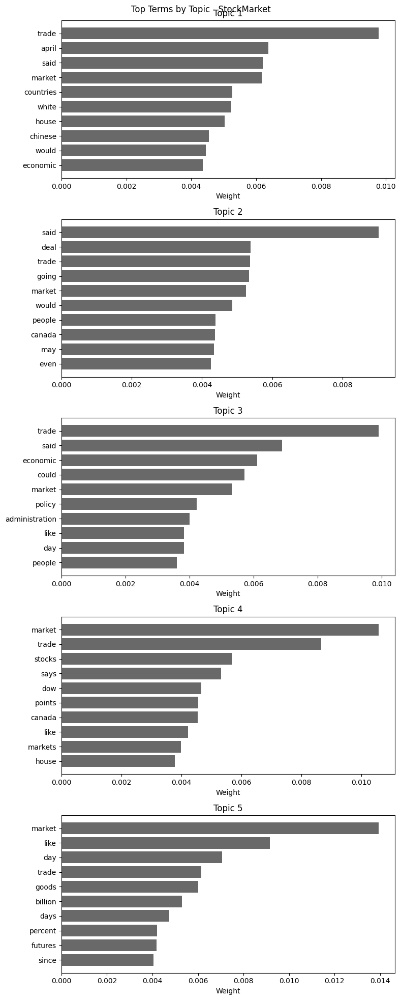


🧾 Topic summary for: Conservative
Topic 1: 0.017*"says" + 0.011*"trade" + 0.007*"canada" + 0.006*"trudeau" + 0.006*"country" + 0.006*"imports" + 0.006*"pain" + 0.005*"mexico" + 0.004*"war" + 0.004*"production"
Topic 2: 0.011*"canada" + 0.011*"imports" + 0.009*"mexico" + 0.008*"says" + 0.007*"countries" + 0.006*"would" + 0.006*"white" + 0.006*"goods" + 0.006*"house" + 0.005*"american"
Topic 3: 0.017*"canada" + 0.012*"mexico" + 0.009*"trade" + 0.008*"pause" + 0.007*"says" + 0.007*"day" + 0.006*"war" + 0.006*"like" + 0.006*"cut" + 0.006*"border"
Topic 4: 0.011*"manufacturing" + 0.009*"dont" + 0.007*"canada" + 0.006*"american" + 0.006*"mexico" + 0.006*"jobs" + 0.006*"war" + 0.005*"countries" + 0.005*"reciprocal" + 0.005*"understand"
Topic 5: 0.009*"think" + 0.007*"people" + 0.007*"time" + 0.007*"usa" + 0.007*"things" + 0.006*"dont" + 0.006*"question" + 0.005*"countries" + 0.005*"threatens" + 0.005*"understand"


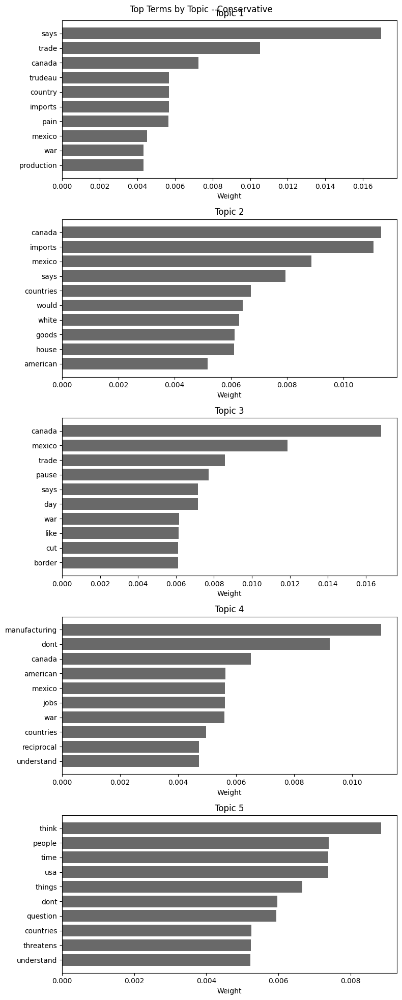


🧾 Topic summary for: AskReddit
Topic 1: 0.019*"country" + 0.015*"american" + 0.015*"usa" + 0.013*"think" + 0.013*"new" + 0.010*"feel" + 0.010*"average" + 0.010*"actually" + 0.008*"work" + 0.008*"market"
Topic 2: 0.026*"think" + 0.017*"would" + 0.012*"americans" + 0.010*"buying" + 0.009*"back" + 0.007*"could" + 0.007*"russia" + 0.007*"price" + 0.007*"conservatives" + 0.007*"make"
Topic 3: 0.043*"americans" + 0.034*"feel" + 0.014*"think" + 0.013*"new" + 0.010*"put" + 0.009*"business" + 0.009*"current" + 0.009*"government" + 0.008*"stock" + 0.007*"place"
Topic 4: 0.036*"think" + 0.019*"thoughts" + 0.014*"going" + 0.011*"imposing" + 0.010*"economy" + 0.010*"whats" + 0.010*"real" + 0.009*"canada" + 0.008*"affect" + 0.008*"people"
Topic 5: 0.024*"whats" + 0.020*"war" + 0.016*"countries" + 0.015*"would" + 0.014*"trade" + 0.012*"opinion" + 0.012*"think" + 0.008*"things" + 0.008*"america" + 0.008*"benefit"


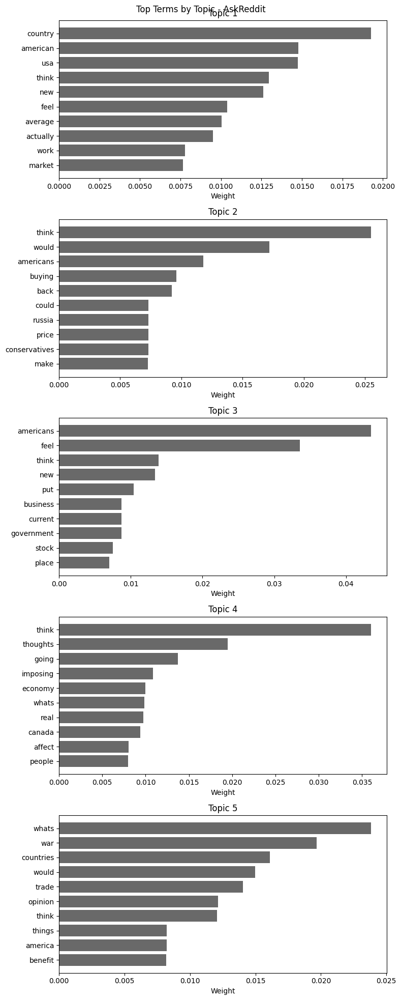


🧾 Topic summary for: AskEconomics
Topic 1: 0.014*"would" + 0.013*"countries" + 0.007*"tax" + 0.007*"goods" + 0.007*"trade" + 0.006*"economy" + 0.006*"dont" + 0.005*"country" + 0.005*"companies" + 0.005*"bad"
Topic 2: 0.014*"would" + 0.011*"goods" + 0.007*"trade" + 0.007*"manufacturing" + 0.007*"could" + 0.007*"countries" + 0.007*"economy" + 0.006*"dont" + 0.006*"like" + 0.005*"lower"
Topic 3: 0.015*"would" + 0.010*"price" + 0.009*"goods" + 0.007*"car" + 0.007*"increase" + 0.006*"imported" + 0.006*"consumer" + 0.006*"market" + 0.005*"could" + 0.004*"domestic"
Topic 4: 0.010*"like" + 0.008*"would" + 0.007*"apple" + 0.006*"countries" + 0.006*"economy" + 0.006*"also" + 0.006*"bad" + 0.005*"could" + 0.005*"work" + 0.005*"taxes"
Topic 5: 0.014*"tax" + 0.014*"would" + 0.012*"country" + 0.009*"countries" + 0.008*"could" + 0.008*"like" + 0.007*"goods" + 0.005*"understand" + 0.005*"way" + 0.005*"make"


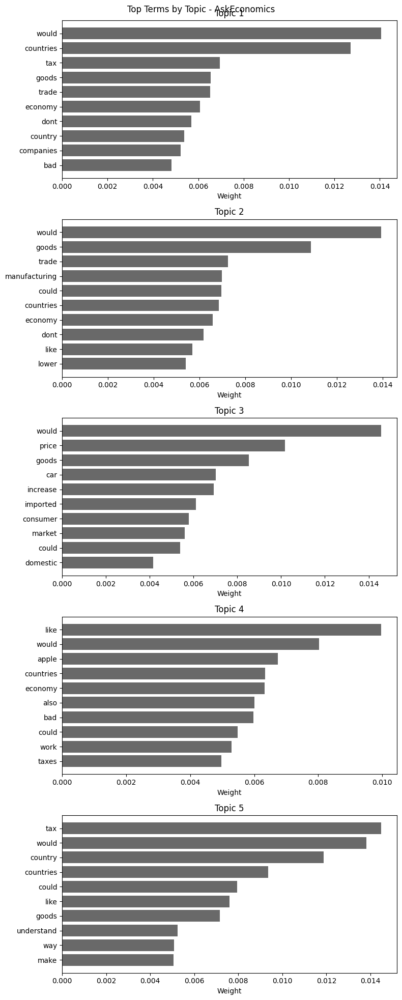


🧾 Topic summary for: Trumponomics
Topic 1: 0.013*"back" + 0.011*"time" + 0.009*"bring" + 0.009*"war" + 0.009*"americans" + 0.007*"last" + 0.007*"american" + 0.007*"like" + 0.007*"might" + 0.007*"going"
Topic 2: 0.009*"canada" + 0.007*"understand" + 0.007*"going" + 0.007*"auto" + 0.006*"make" + 0.006*"american" + 0.006*"products" + 0.006*"would" + 0.006*"check" + 0.006*"lot"
Topic 3: 0.009*"countries" + 0.009*"says" + 0.007*"canada" + 0.007*"cost" + 0.007*"american" + 0.007*"chinese" + 0.005*"got" + 0.005*"end" + 0.005*"products" + 0.005*"stop"
Topic 4: 0.009*"canada" + 0.009*"canadian" + 0.006*"american" + 0.006*"free" + 0.006*"ill" + 0.006*"money" + 0.006*"month" + 0.006*"says" + 0.005*"cars" + 0.005*"mexico"
Topic 5: 0.011*"says" + 0.009*"mexico" + 0.009*"threatens" + 0.006*"products" + 0.006*"americans" + 0.006*"stocks" + 0.006*"cars" + 0.006*"vows" + 0.006*"dow" + 0.006*"days"


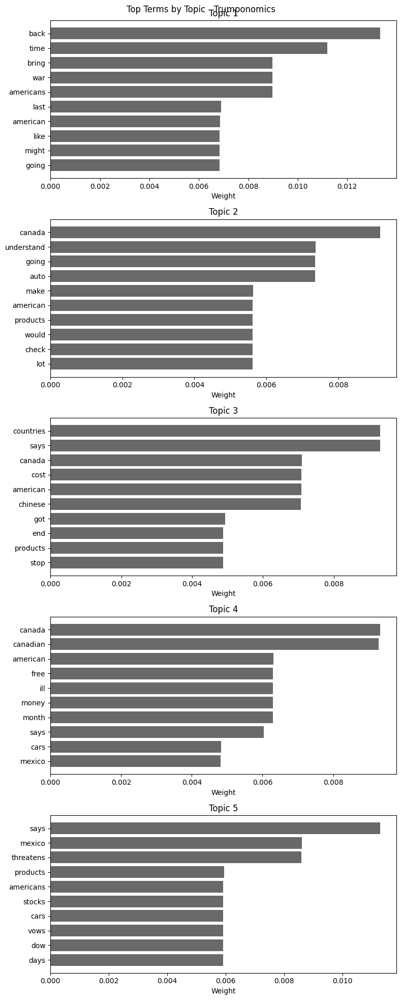


🧾 Topic summary for: Tariffs
Topic 1: 0.128*"usca" + 0.017*"mercedesbenz" + 0.014*"toyota" + 0.014*"honda" + 0.013*"suv" + 0.011*"hybrid" + 0.011*"model" + 0.011*"tesla" + 0.011*"gle" + 0.011*"crv"
Topic 2: 0.012*"canada" + 0.007*"american" + 0.007*"get" + 0.005*"like" + 0.005*"know" + 0.005*"people" + 0.005*"want" + 0.005*"even" + 0.005*"together" + 0.005*"canadian"
Topic 3: 0.007*"post" + 0.007*"like" + 0.006*"usa" + 0.005*"policy" + 0.005*"trade" + 0.005*"products" + 0.005*"going" + 0.005*"business" + 0.004*"countries" + 0.004*"canada"
Topic 4: 0.014*"amazon" + 0.008*"cant" + 0.005*"also" + 0.005*"cost" + 0.005*"import" + 0.005*"impact" + 0.005*"sellers" + 0.005*"things" + 0.005*"numbers" + 0.005*"know"
Topic 5: 0.011*"april" + 0.010*"goods" + 0.010*"subject" + 0.009*"reciprocal" + 0.008*"trade" + 0.008*"effective" + 0.008*"countries" + 0.007*"annex" + 0.007*"new" + 0.007*"products"


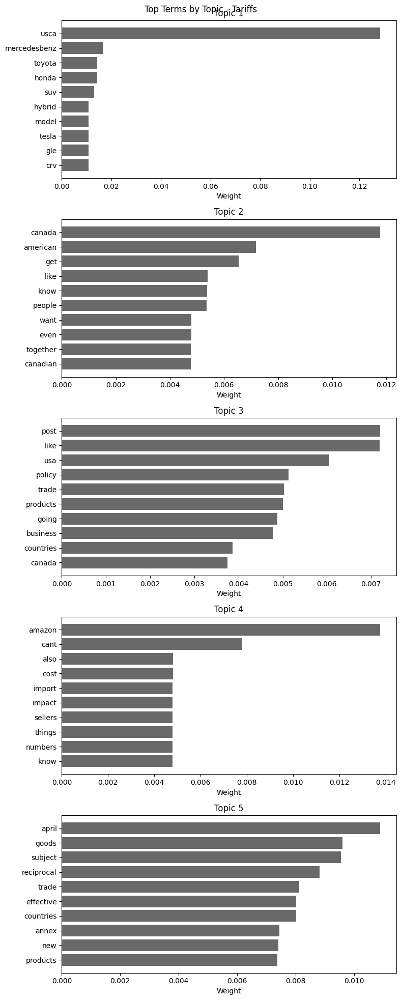

,subreddit,topic,word,weight
0,All Subreddits,1,usca,0.009765
1,All Subreddits,1,reciprocal,0.008694
2,All Subreddits,1,april,0.006367
3,All Subreddits,1,etf,0.004973
4,All Subreddits,1,bessent,0.004481


In [ ]:
#Define custom stopwords (updated as requested)
custom_stopwords = set(stopwords.words('english')).union(set([
    'n','tariff','tariffs','trump','trumps','china','us','good','say','u','s','go',
    'president','donald','united','states','format','png','webp','content','support','reddit'
]))

#Text preprocessing
def preprocess(text):
    text = re.sub(r'http\S+|www\S+|@\S+', '', str(text))
    text = re.sub(r'[^a-zA-Z\s]', '', text)
    tokens = text.lower().split()
    return [word for word in tokens if word not in custom_stopwords and len(word) > 2]

pd_combined['tokens'] = pd_combined['text'].astype(str).apply(preprocess)

#Bar chart plotting function
def plot_topic_terms(lda_model, num_words=10, label="Overall"):
    topics = lda_model.show_topics(num_topics=-1, num_words=num_words, formatted=False)
    num_topics = len(topics)

    fig, axes = plt.subplots(nrows=num_topics, figsize=(8, 4 * num_topics))
    if num_topics == 1:
        axes = [axes]

    for i, topic in enumerate(topics):
        topic_num, word_probs = topic
        words, probs = zip(*word_probs)
        axes[i].barh(words[::-1], probs[::-1], color='dimgray')
        axes[i].set_title(f"Topic {topic_num + 1}")
        axes[i].set_xlabel('Weight')
    fig.suptitle(f"Top Terms by Topic - {label}")
    plt.tight_layout()
    plt.show()

#Store topics for all subreddits
all_topics = []

# 7. 🔁 Run LDA and store topic details
def lda_and_store(df, label="Overall"):
    df = df[df['tokens'].map(len) > 0]
    if df.empty:
        print(f"⚠️ Skipped: {label} (no valid tokens)")
        return

    dictionary = corpora.Dictionary(df['tokens'])
    corpus = [dictionary.doc2bow(text) for text in df['tokens']]

    lda_model = models.LdaModel(corpus=corpus, id2word=dictionary, num_topics=5, passes=10, random_state=42)

    print(f"\n🧾 Topic summary for: {label}")
    for idx, topic in lda_model.print_topics(-1):
        print(f"Topic {idx + 1}: {topic}")

    # Save topic terms to all_topics list
    topics = lda_model.show_topics(num_topics=5, num_words=10, formatted=False)
    for topic_num, words_probs in topics:
        for word, weight in words_probs:
            all_topics.append({'subreddit': label, 'topic': topic_num + 1, 'word': word, 'weight': weight})

    # Plot topics
    plot_topic_terms(lda_model, label=label)

#Run on overall
lda_and_store(pd_combined, label="All Subreddits")

#Run for each subreddit
for sub in pd_combined['subreddit'].unique():
    lda_and_store(pd_combined[pd_combined['subreddit'] == sub], label=sub)

#Create final dataframe
df_topics = pd.DataFrame(all_topics)
df_topics.head()


In [ ]:
df_topics

,subreddit,topic,word,weight
0,All Subreddits,1,usca,0.009765
1,All Subreddits,1,reciprocal,0.008694
2,All Subreddits,1,april,0.006367
3,All Subreddits,1,etf,0.004973
4,All Subreddits,1,bessent,0.004481
...,...,...,...,...
695,Tariffs,5,effective,0.008029
696,Tariffs,5,countries,0.008021
697,Tariffs,5,annex,0.007441
698,Tariffs,5,new,0.007420


In [ ]:
df_edges = df_edges[df_edges['source'] != 'All Subreddits']  # if present

# Create graph
G = nx.Graph()
for _, row in df_edges.iterrows():
    G.add_edge(row['source'], row['target'], weight=row['weight'])

# Define edge colors based on weight (for transparency and color intensity)
weights = [G[u][v]['weight'] for u, v in G.edges()]
norm = mcolors.Normalize(vmin=min(weights), vmax=max(weights))
cmap = cm.Blues
edge_colors = [cmap(norm(w)) for w in weights]

# Plot different layouts
layouts = {
    'Spring': nx.spring_layout(G, seed=42),
    'Circular': nx.circular_layout(G),
    'Shell': nx.shell_layout(G),
    'Kamada-Kawai': nx.kamada_kawai_layout(G)
}

fig, axes = plt.subplots(2, 2, figsize=(16, 12))
axes = axes.flatten()

for ax, (name, pos) in zip(axes, layouts.items()):
    ax.set_title(f'{name} Layout', fontsize=14)
    nx.draw_networkx_nodes(G, pos, ax=ax, node_color='lightgrey', node_size=1000)
    nx.draw_networkx_edges(G, pos, ax=ax, edge_color=edge_colors, width=2)
    nx.draw_networkx_labels(G, pos, ax=ax, font_size=12)
    ax.axis('off')

plt.tight_layout()
plt.suptitle("Subreddit Network - Multiple Layouts", fontsize=18, y=1.02)
plt.show()


NameError: name 'df_edges' is not defined

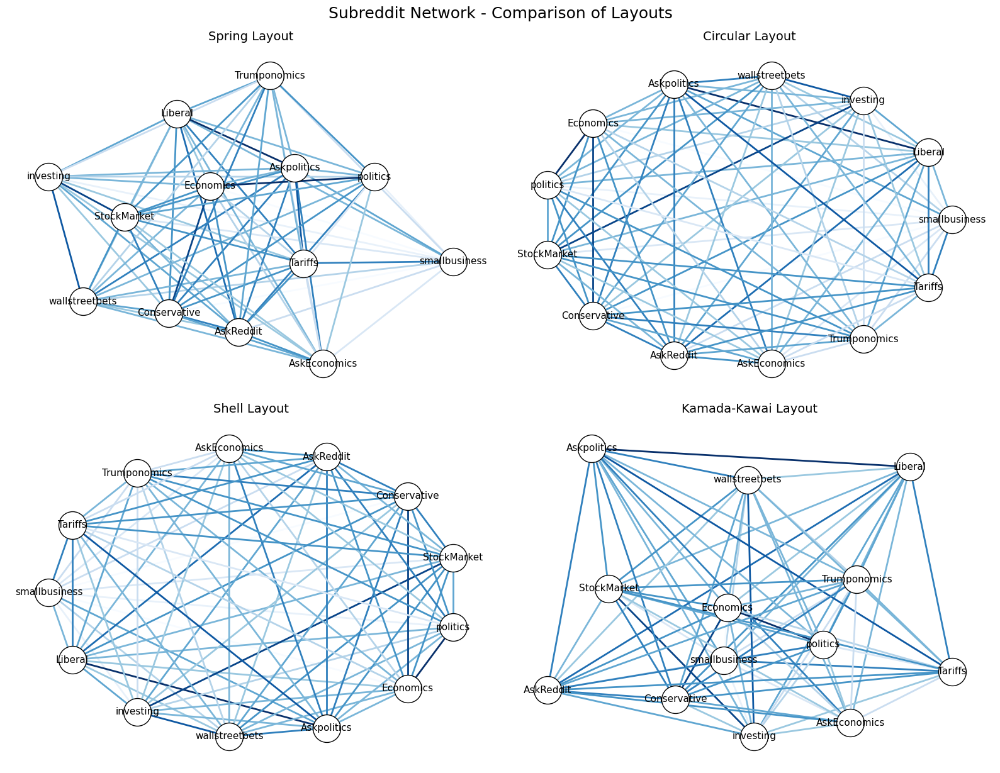

In [ ]:


# Ensure 'df_topics' already exists in your Colab environment
# If not, load it before running this block

# Filter out 'All Subreddits' and group words by subreddit
subreddit_words = defaultdict(set)
for _, row in df_topics[df_topics['subreddit'] != 'All Subreddits'].iterrows():
    subreddit_words[row['subreddit']].add(row['word'])

# Create graph based on shared words
G = nx.Graph()
subreddits = list(subreddit_words.keys())
for i in range(len(subreddits)):
    for j in range(i + 1, len(subreddits)):
        s1, s2 = subreddits[i], subreddits[j]
        shared = subreddit_words[s1].intersection(subreddit_words[s2])
        weight = len(shared)
        if weight > 0:
            G.add_edge(s1, s2, weight=weight)

# Prepare edge styling
weights = [d['weight'] for _, _, d in G.edges(data=True)]
norm = Normalize(vmin=min(weights), vmax=max(weights))
cmap = cm.Blues
edge_colors = [cmap(norm(w)) for w in weights]

# Define layout types
layouts = {
    'Spring': nx.spring_layout(G, seed=42),
    'Circular': nx.circular_layout(G),
    'Shell': nx.shell_layout(G),
    'Kamada-Kawai': nx.kamada_kawai_layout(G)
}

# Plot all layouts side-by-side
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
axes = axes.flatten()

for ax, (layout_name, pos) in zip(axes, layouts.items()):
    ax.set_title(f"{layout_name} Layout", fontsize=14)
    nx.draw_networkx_nodes(G, pos, ax=ax, node_color='white', edgecolors='black', node_size=1000)
    nx.draw_networkx_edges(G, pos, ax=ax, edge_color=edge_colors, width=2)
    nx.draw_networkx_labels(G, pos, ax=ax, font_size=11)
    ax.axis('off')

plt.tight_layout()
plt.suptitle("Subreddit Network - Comparison of Layouts", fontsize=18, y=1.02)
plt.show()


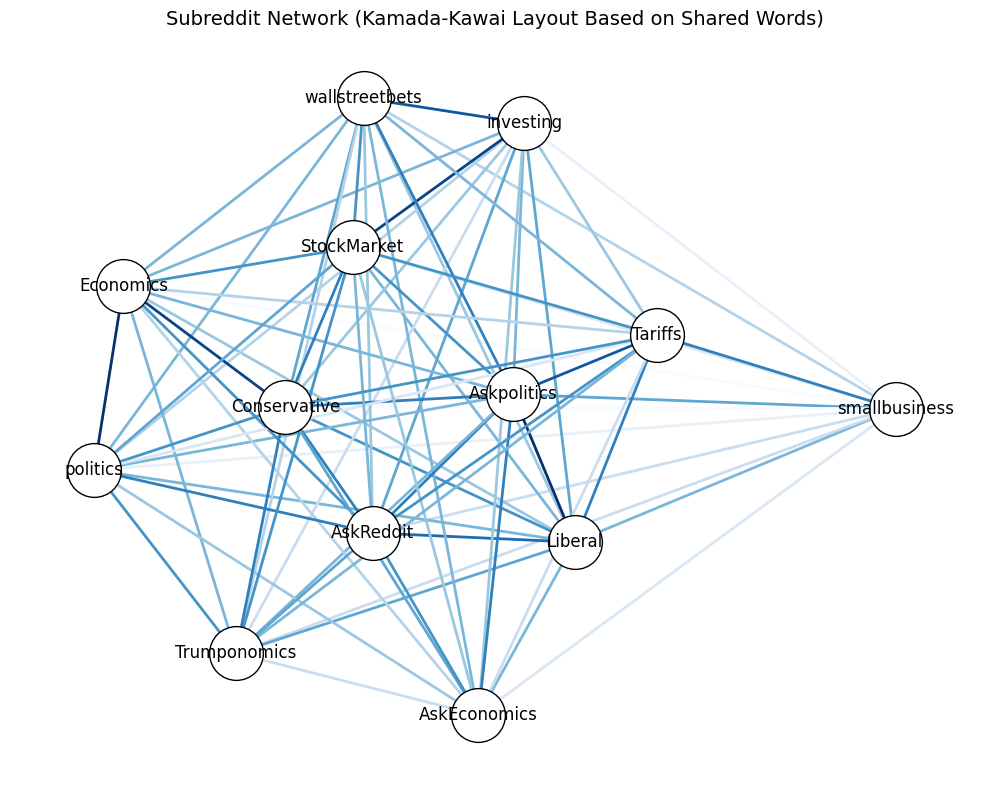

In [ ]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.colors import Normalize
from collections import defaultdict

# Ensure 'df_topics' exists and exclude 'All Subreddits'
df_clean = df_topics[df_topics['subreddit'] != 'All Subreddits']

# Build mapping: subreddit → set of words
subreddit_words = defaultdict(set)
for _, row in df_clean.iterrows():
    subreddit_words[row['subreddit']].add(row['word'])

# Create weighted graph from shared words
G = nx.Graph()
subreddits = list(subreddit_words.keys())

for i in range(len(subreddits)):
    for j in range(i + 1, len(subreddits)):
        s1, s2 = subreddits[i], subreddits[j]
        shared = subreddit_words[s1].intersection(subreddit_words[s2])
        weight = len(shared)
        if weight > 0:
            G.add_edge(s1, s2, weight=weight, inv_weight=1 / weight)

# Layout: Kamada-Kawai using inverse weight (more shared words → closer together)
pos = nx.kamada_kawai_layout(G, weight='inv_weight')

# Styling: edge color by shared word count
weights = [d['weight'] for _, _, d in G.edges(data=True)]
norm = Normalize(vmin=min(weights), vmax=max(weights))
cmap = cm.Blues
edge_colors = [cmap(norm(w)) for w in weights]

# Draw network
plt.figure(figsize=(10, 8))
nx.draw_networkx_nodes(G, pos, node_color='white', edgecolors='black', node_size=1500)
nx.draw_networkx_edges(G, pos, edge_color=edge_colors, width=2)
nx.draw_networkx_labels(G, pos, font_size=12)
plt.title("Subreddit Network (Kamada-Kawai Layout Based on Shared Words)", fontsize=14)
plt.axis('off')
plt.tight_layout()
plt.show()


## Install Stuff

In [ ]:
!pip install nrclex

INFO: pip is looking at multiple versions of nrclex to determine which version is compatible with other requirements. This could take a while.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 396.4/396.4 kB 7.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for nrclex: filename=NRCLex-3.0.0-py3-none-any.whl size=43309 sha256=8a8e83c52e371a10c9fac7deeea933ae009becad9818f622fe7dbf7a792b09e4
  Stored in directory: /root/.cache/pip/wheels/ed/ac/fa/7afddefd14f51c4a963ed291b9052746ed3929473e5a33118d
Successfully built nrclex


In [ ]:
!pip install spacytextblob

In [ ]:
%pip install praw

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 189.3/189.3 kB 4.5 MB/s eta 0:00:00


In [ ]:
!python -m spacy download en_core_web_md

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 33.5/33.5 MB 49.0 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_md')
⚠ Restart to reload dependencies
If you are in a Jupyter or Colab notebook, you may need to restart Python in
order to load all the package's dependencies. You can do this by selecting the
'Restart kernel' or 'Restart runtime' option.


In [ ]:
import pandas as pd
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import spacy
import re
import seaborn as sns
import time
import numpy as np
import praw
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation as LDA
import plotly.express as px
import plotly.graph_objs as go
import plotly.offline as py
from spacytextblob.spacytextblob import SpacyTextBlob
import nltk
from nrclex import NRCLex
import plotly.graph_objects as go
from statsmodels.nonparametric.smoothers_lowess import lowess

In [ ]:
reddit = praw.Reddit(client_id='qnqKidg44ZKWUacYo4HZGw',
                     client_secret='FjZYqbw9V6N4FPOSdL_TAcF9dq1o_w',
                     user_agent='guidoquant')

## Summary Stats

In [ ]:
pd_combined = pd.read_csv('pd_combined.csv')

In [ ]:
nlp = spacy.load("en_core_web_md")

In [ ]:
pd_combined.dropna(inplace = True)
#pd_combined

In [ ]:
import pandas as pd
import plotly.express as px
import plotly.io as pio

# Ensure 'created' is in datetime format
pd_combined['created'] = pd.to_datetime(pd_combined['created'])

# Set datetime index and resample by month
monthly_comments = (
    pd_combined
    .set_index('created')
    .resample('M')['num_comments']
    .sum()
    .reset_index()
)

# Plot with Plotly Express
fig = px.line(
    monthly_comments,
    x='created',
    y='num_comments',
    title='Monthly Total Comments Over Time',
    labels={'created': 'Date', 'num_comments': 'Number of Comments'},
    template='simple_white'
)

# Update font to something Garamond-like (e.g., 'Georgia' or 'Palatino Linotype')
fig.update_layout(
    font=dict(family='Georgia', size=14),
    title_font=dict(size=20, family='Georgia', color='black'),
    xaxis_title_font=dict(size=16),
    yaxis_title_font=dict(size=16),
    hoverlabel=dict(font_family='Georgia')
)

# Clean axis and lines like The Economist style
fig.update_traces(line=dict(width=2.5))
fig.update_xaxes(showgrid=True, gridwidth=0.5, gridcolor='lightgray')
fig.update_yaxes(showgrid=True, gridwidth=0.5, gridcolor='lightgray')

# Show the interactive plot
fig.show()


<ipython-input-10-73a43332f41c>:12: FutureWarning:

'M' is deprecated and will be removed in a future version, please use 'ME' instead.



In [ ]:
import pandas as pd
import plotly.express as px

# Ensure 'created' is in datetime format
pd_combined['created'] = pd.to_datetime(pd_combined['created'])

# Group by subreddit and month, summing num_comments
monthly_subreddit_comments = (
    pd_combined
    .groupby([pd.Grouper(key='created', freq='M'), 'subreddit'])['num_comments']
    .sum()
    .reset_index()
)

# Plot with Plotly Express
fig = px.line(
    monthly_subreddit_comments,
    x='created',
    y='num_comments',
    color='subreddit',
    title='Monthly Total Comments by Subreddit',
    labels={'created': 'Date', 'num_comments': 'Number of Comments', 'subreddit': 'Subreddit'},
    template='simple_white'
)

# Update layout to look clean and stylish
fig.update_layout(
    font=dict(family='Georgia', size=14),
    title_font=dict(size=20, family='Georgia', color='black'),
    xaxis_title_font=dict(size=16),
    yaxis_title_font=dict(size=16),
    hoverlabel=dict(font_family='Georgia'),
    legend_title_text='Subreddit'
)

# Aesthetic tweaks
fig.update_traces(line=dict(width=2))
fig.update_xaxes(showgrid=True, gridwidth=0.5, gridcolor='lightgray')
fig.update_yaxes(showgrid=True, gridwidth=0.5, gridcolor='lightgray')

# Show the interactive plot
fig.show()


<ipython-input-11-b2d72773c40d>:10: FutureWarning:

'M' is deprecated and will be removed in a future version, please use 'ME' instead.



In [ ]:
import pandas as pd
import plotly.express as px

# Ensure 'created' is in datetime format
pd_combined['created'] = pd.to_datetime(pd_combined['created'])

# Count unique post IDs per month
monthly_posts = (
    pd_combined
    .set_index('created')
    .resample('M')['id']
    .nunique()
    .reset_index(name='num_posts')
)

# Plot
fig = px.line(
    monthly_posts,
    x='created',
    y='num_posts',
    title='Monthly Total Posts Over Time',
    labels={'created': 'Date', 'num_posts': 'Number of Posts'},
    template='simple_white'
)

# Style like The Economist
fig.update_layout(
    font=dict(family='Georgia', size=14),
    title_font=dict(size=20, family='Georgia', color='black'),
    xaxis_title_font=dict(size=16),
    yaxis_title_font=dict(size=16),
    hoverlabel=dict(font_family='Georgia')
)
fig.update_traces(line=dict(width=2.5))
fig.update_xaxes(showgrid=True, gridwidth=0.5, gridcolor='lightgray')
fig.update_yaxes(showgrid=True, gridwidth=0.5, gridcolor='lightgray')

fig.show()


<ipython-input-12-3c6ca8116375>:11: FutureWarning:

'M' is deprecated and will be removed in a future version, please use 'ME' instead.



In [ ]:
# Group by subreddit and month, counting unique post IDs
monthly_posts_by_subreddit = (
    pd_combined
    .groupby([pd.Grouper(key='created', freq='M'), 'subreddit'])['id']
    .nunique()
    .reset_index(name='num_posts')
)

# Plot
fig = px.line(
    monthly_posts_by_subreddit,
    x='created',
    y='num_posts',
    color='subreddit',
    title='Monthly Total Posts by Subreddit',
    labels={'created': 'Date', 'num_posts': 'Number of Posts', 'subreddit': 'Subreddit'},
    template='simple_white'
)

# Apply styling
fig.update_layout(
    font=dict(family='Georgia', size=14),
    title_font=dict(size=20, family='Georgia', color='black'),
    xaxis_title_font=dict(size=16),
    yaxis_title_font=dict(size=16),
    hoverlabel=dict(font_family='Georgia'),
    legend_title_text='Subreddit'
)
fig.update_traces(line=dict(width=2))
fig.update_xaxes(showgrid=True, gridwidth=0.5, gridcolor='lightgray')
fig.update_yaxes(showgrid=True, gridwidth=0.5, gridcolor='lightgray')

fig.show()


<ipython-input-13-c7ae3d7f5835>:4: FutureWarning:

'M' is deprecated and will be removed in a future version, please use 'ME' instead.



## LDA New

In [ ]:
!pip install gensim

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 2.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.6/60.6 kB 4.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 26.7/26.7 MB 32.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.3/18.3 MB 36.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 38.6/38.6 MB 9.4 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 2.0.2
    Uninstalling numpy-2.0.2:
      Successfully uninstalled numpy-2.0.2
  Attempting uninstall: scipy
    Found existing installation: scipy 1.15.2
    Uninstalling scipy-1.15.2:
      Successfully uninstalled scipy-1.15.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
thinc 8.3.6 requires numpy<3.0.0,>=2.0.0, but you have numpy 1.26.4 which is incompatible.


In [ ]:
# ── FIX VERSION MISMATCH ──────────────────────────────────────────
!pip -q install --upgrade "scipy<1.12"        # 1.11.4 at time of writing
# (OPTIONAL) keep numpy in sync with older SciPy:
!pip -q install --upgrade "numpy<1.27"

# ── LOAD REST OF THE STACK ───────────────────────────────────────
!pip -q install gensim==4.3.2 pyLDAvis==3.4.1 nltk seaborn

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.4/60.4 kB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 36.4/36.4 MB 22.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 26.7/26.7 MB 95.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.6/2.6 MB 91.1 MB/s eta 0:00:00


In [ ]:
import pandas as pd, numpy as np, re, string, matplotlib.pyplot as plt, seaborn as sns
from gensim import corpora
from gensim.models import LdaModel
from nltk.corpus import stopwords
import nltk
nltk.download('stopwords')

ImportError: cannot import name 'triu' from 'scipy.linalg' (/usr/local/lib/python3.11/dist-packages/scipy/linalg/__init__.py)

In [ ]:
# 1.   Style ─ try to mimic The Economist look
plt.rcParams.update({
    "figure.figsize": (10, 6),
    "axes.titlesize": 16,
    "axes.labelsize": 13,
    "axes.spines.top": False,
    "axes.spines.right": False,
    "font.family": "serif",
    "font.serif": ["Georgia"],
})

In [ ]:



sns.set_style("whitegrid")

# 2.   Extra stop-words supplied by Guido
extra_sw = ['n','tariff','trump','china','us','good','say','u','s','go',
            'president','donald','united','states','format','png','webp',
            'content','support','reddit']
stoplist = set(stopwords.words('english')).union(extra_sw)

# 3.   Pre-processing helper
def clean_and_tokenise(text:str) -> list:
    text = re.sub(r"https?://\S+|www\.\S+", " ", str(text))        # drop URLs
    text = re.sub(r"[^A-Za-z]+", " ", text).lower()                # keep letters
    tokens = [t for t in text.split() if t not in stoplist and len(t) > 2]
    return tokens

def prepare_corpus(df:pd.DataFrame, text_col:str="text", min_df:int=10, max_df:float=0.5):
    docs = df[text_col].fillna("").apply(clean_and_tokenise).tolist()
    dictionary = corpora.Dictionary(docs)
    dictionary.filter_extremes(no_below=min_df, no_above=max_df)
    corpus = [dictionary.doc2bow(doc) for doc in docs]
    return docs, corpus, dictionary

def fit_lda(corpus, dictionary, num_topics:int=10, passes:int=10, seed:int=42):
    model = LdaModel(corpus=corpus,
                     id2word=dictionary,
                     num_topics=num_topics,
                     random_state=seed,
                     passes=passes,
                     alpha="auto",
                     eta="auto")
    return model

def dominant_topic_per_doc(model, corpus):
    dominant = [max(model.get_document_topics(bow), key=lambda tup: tup[1])[0]
                if len(model.get_document_topics(bow)) else -1
                for bow in corpus]
    return np.array(dominant)

def plot_topic_shares(ax, counts, title):
    sns.barplot(x=counts.index, y=counts.values, ax=ax, palette="muted")
    ax.set_xlabel("Topic")
    ax.set_ylabel("Share of documents")
    ax.set_title(title)
    ax.set_xticklabels(counts.index, rotation=0)

def plot_top_words(ax, model, dictionary, topic_id, num_words=10):
    words = model.show_topic(topic_id, num_words=num_words)
    terms, weights = zip(*words)
    sns.barplot(x=list(weights), y=list(terms), ax=ax, palette="deep")
    ax.set_title(f"Topic {topic_id}: top {num_words} words")
    ax.set_xlabel("")
    ax.set_ylabel("")

def run_and_plot(df_slice, label, n_topics=10):
    docs, corpus, dictionary = prepare_corpus(df_slice)
    lda = fit_lda(corpus, dictionary, num_topics=n_topics)

    dom = dominant_topic_per_doc(lda, corpus)
    share = pd.Series(dom).value_counts(normalize=True).sort_index()

    #  -- Charts
    fig = plt.figure(constrained_layout=True, figsize=(12, 5 + n_topics*1.5))
    gs = fig.add_gridspec(2, 2, height_ratios=[1, n_topics])
    ax0 = fig.add_subplot(gs[0, :])
    plot_topic_shares(ax0, share, f"{label} · topic prevalence")

    # One row per topic with its top-words bars
    for i in range(n_topics):
        ax = fig.add_subplot(gs[1, i % 2]) if n_topics == 2 else fig.add_subplot(gs[1, 0])
    # (For cleaner layout individual topic bars are shown in a separate figure:)
    for i in range(n_topics):
        fig_t = plt.figure(figsize=(6,3))
        ax_t = fig_t.add_subplot(111)
        plot_top_words(ax_t, lda, dictionary, i)
        fig_t.suptitle(f"{label} · Topic {i}", y=1.05, fontsize=14)
        plt.tight_layout()
        plt.show()

    return lda

# 4.   Load data – comment this out if pd_combined already exists
# pd_combined = pd.read_csv("/content/path_to_your_file.csv")

# Optional: parse the created column
pd_combined["created"] = pd.to_datetime(pd_combined["created"], errors="coerce")

# 5.   Run for entire file
print("======  Overall file  ======")
lda_overall = run_and_plot(pd_combined, "Overall")

# 6.   Run for each subreddit
for sub, sub_df in pd_combined.groupby("subreddit"):
    if len(sub_df) < 50:          # skip tiny subreddits to save time
        continue
    print(f"\n======  r/{sub}  ======")
    _ = run_and_plot(sub_df, f"r/{sub}")


======  Overall file  ======


NameError: name 'corpora' is not defined

## Wordstream Analysis

In [ ]:
def wc(df,bgcolor = 'white',title = ""):
    plt.figure(figsize = (10,10))
    x, y = np.ogrid[:300, :300]
    mask = (x - 150) ** 2 + (y - 150) ** 2 > 140 ** 2
    mask = 255 * mask.astype(int)
    wc = WordCloud(background_color = bgcolor, max_words = 2000, random_state=50, max_font_size = 50, mask = mask)
    wc.generate(' '.join(df['strings']))
    plt.imshow(wc)
    plt.axis('off')

In [ ]:
doc = [nlp(x) for x in pd_combined.text]
manual_stops = ['n','tariff','trump','china','us','good','say','u','s','go','president','donald','united','states','format','png','webp','content','support','reddit']

cleaned_lemmas = []
cleaned_string = []
for x in doc:
  text = [token.lemma_.lower() for token in x if not token.is_stop and not token.is_punct and not token.like_num and token.lemma_.lower() not in manual_stops]
  cleaned_lemmas.append(text)
  cleaned_string.append(" ".join(text))

pd_combined['lemmas'] = cleaned_lemmas
pd_combined['strings'] = cleaned_string
pd_combined['strings'] = [re.sub(r"http\S+", "", x) for x in pd_combined['strings']]



In [ ]:
def wc(df, bgcolor='white', title="", mask_image_path=None):
    plt.figure(figsize=(10, 10))

    if mask_image_path:
        from PIL import Image
        mask = np.array(Image.open(mask_image_path))
    else:
        x, y = np.ogrid[:300, :300]
        mask = (x - 150) ** 2 + (y - 150) ** 2 > 140 ** 2
        mask = 255 * mask.astype(int)

    wc = WordCloud(background_color=bgcolor, max_words=5000, random_state=50, max_font_size=50, mask=mask)
    wc.generate(' '.join(df['strings'])) ###### IF YOU PLOT 'text' INSTEAD OF 'strings' YOU WILL GET LESS MEANINGFUL WORDCLOUDS ######
    plt.imshow(wc)
    plt.axis('off')
    plt.title(title) # Added title display
    plt.show() # Added show() to display the plot


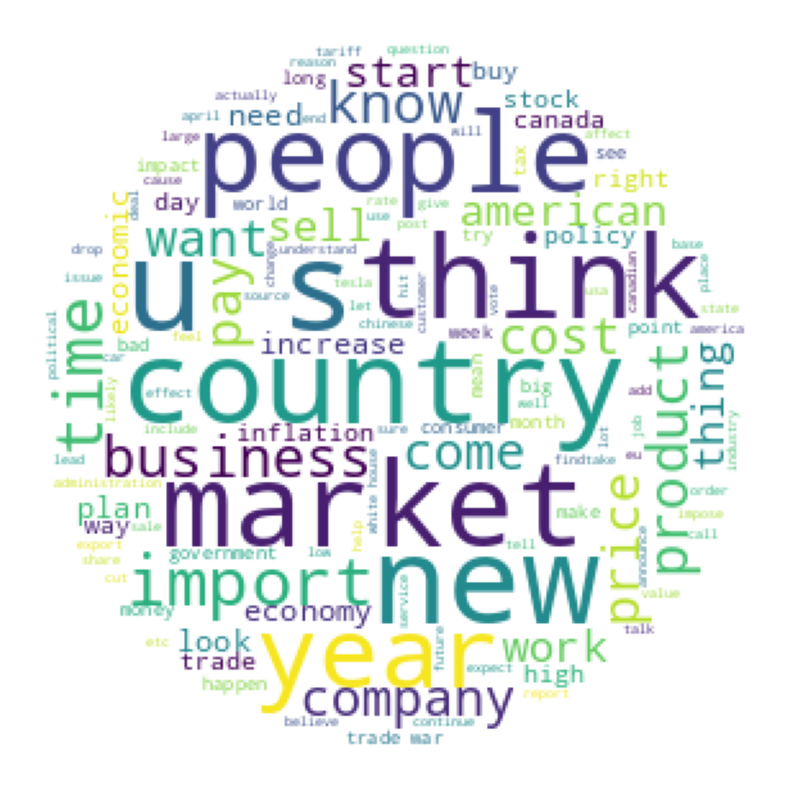

In [ ]:
wc(pd_combined)

In [ ]:
import plotly.express as px
import plotly.graph_objects as go

import pandas as pd
import plotly.express as px
from collections import Counter
import numpy as np

# Ensure 'created' is datetime
pd_combined['created'] = pd.to_datetime(pd_combined['created'])

# Flatten all lemmas and get top 5 most common words overall
all_lemmas = [lemma for sublist in pd_combined['lemmas'] for lemma in sublist]
top5_words = [word for word, _ in Counter(all_lemmas).most_common(5)]

# Create a new column with only top 5 words in each row
pd_combined['top_words_only'] = pd_combined['lemmas'].apply(
    lambda lemmas: [word for word in lemmas if word in top5_words]
)

import re

rows = []
for _, row in pd_combined.iterrows():
    for word in row['top_words_only']:
        cleaned_word = word.strip().lower()
        if cleaned_word and not re.match(r'^\s*$', cleaned_word):  # filters empty, tabs, and spaces
            rows.append({'created': row['created'], 'word': cleaned_word})

# Create DataFrame
words_df = pd.DataFrame(rows)

# Group by month and word, count occurrences
words_df_monthly = (
    words_df
    .groupby([pd.Grouper(key='created', freq='M'), 'word'])
    .size()
    .reset_index(name='count')
)


# Create base figure
fig = px.line(
    words_df_monthly,
    x='created',
    y='count',
    color='word',
    labels={'created': 'Date', 'count': 'Word Count', 'word': 'Word'},
    title='Monthly Frequency of Top 5 Words',
    template='simple_white'
)

# Add labels at the end of each line
for word in words_df_monthly['word'].unique():
    word_data = words_df_monthly[words_df_monthly['word'] == word]
    last_row = word_data[word_data['created'] == word_data['created'].max()]
    fig.add_trace(
        go.Scatter(
            x=last_row['created'],
            y=last_row['count'],
            mode='text',
            text=[word],
            textposition='middle right',
            showlegend=False,
            textfont=dict(family='Georgia', size=14, color='black')
        )
    )

# Layout style
fig.update_layout(
    font=dict(family='Georgia', size=14),
    title_font=dict(size=20, family='Georgia'),
    hoverlabel=dict(font_family='Georgia'),
    legend_title_text='Word'
)
fig.update_traces(line=dict(width=2))
fig.update_xaxes(showgrid=True, gridcolor='lightgray')
fig.update_yaxes(showgrid=True, gridcolor='lightgray')

fig.show()


<ipython-input-38-5a96be118ad2>:36: FutureWarning:

'M' is deprecated and will be removed in a future version, please use 'ME' instead.



## word count analysis + LDA

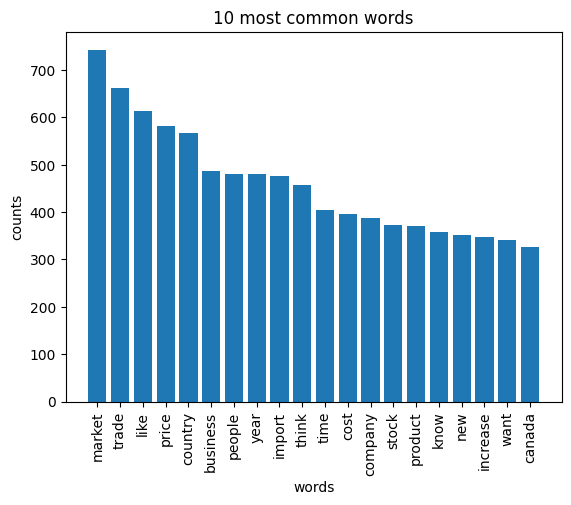

In [ ]:
def plot_10_most_common_words(count_data, count_vectorizer):
    import matplotlib.pyplot as plt
    words = count_vectorizer.get_feature_names_out()
    total_counts = np.zeros(len(words))
    for t in count_data:
        total_counts+=t.toarray()[0]

    count_dict = (zip(words, total_counts))
    count_dict = sorted(count_dict, key = lambda x:x[1], reverse=True)[0:20]
    words = [w[0] for w in count_dict]
    counts = [w[1] for w in count_dict]
    x_pos = np.arange(len(words))

    plt.bar(x_pos, counts,align = 'center')
    plt.xticks(x_pos, words, rotation = 90)
    plt.xlabel('words')
    plt.ylabel('counts')
    plt.title('10 most common words')
    plt.show()

count_vectorizer = CountVectorizer(stop_words = 'english')

count_data = count_vectorizer.fit_transform(pd_combined['strings'])
plot_10_most_common_words(count_data, count_vectorizer)

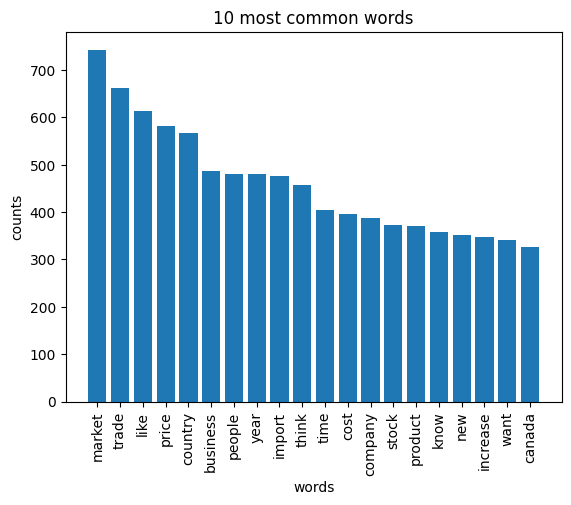

In [ ]:
count_data = count_vectorizer.fit_transform(pd_combined['strings'])  #### PROCESSED!
plot_10_most_common_words(count_data, count_vectorizer)

In [ ]:
def print_topics(model, count_vectorizer, n_top_words):
    words = count_vectorizer.get_feature_names_out()
    for topic_idx, topic in enumerate(model.components_):
        print("\nTopic #%d:" % topic_idx)
        print(" ".join([words[i]
                        for i in topic.argsort()[:-n_top_words - 1:-1]]))

# Tweak the two parameters below (use int values below 15)
number_topics = 4
number_words = 15

# Create and fit the LDA model
lda = LDA(n_components = number_topics)
lda.fit(count_data)

# Print the topics found by the LDA model
print("Topics found via LDA:")

print_topics(lda, count_vectorizer, number_words)

Topics found via LDA:

Topic #0:
year pay bond time new stock import market duty product like term long day revenue

Topic #1:
business price cost product small like need sell company import think year increase want start

Topic #2:
market tax like trade price people consumer news inflation stock economy high tesla time economic

Topic #3:
country trade market canada like import people think american impose stock economic war export eu


## X-Grams

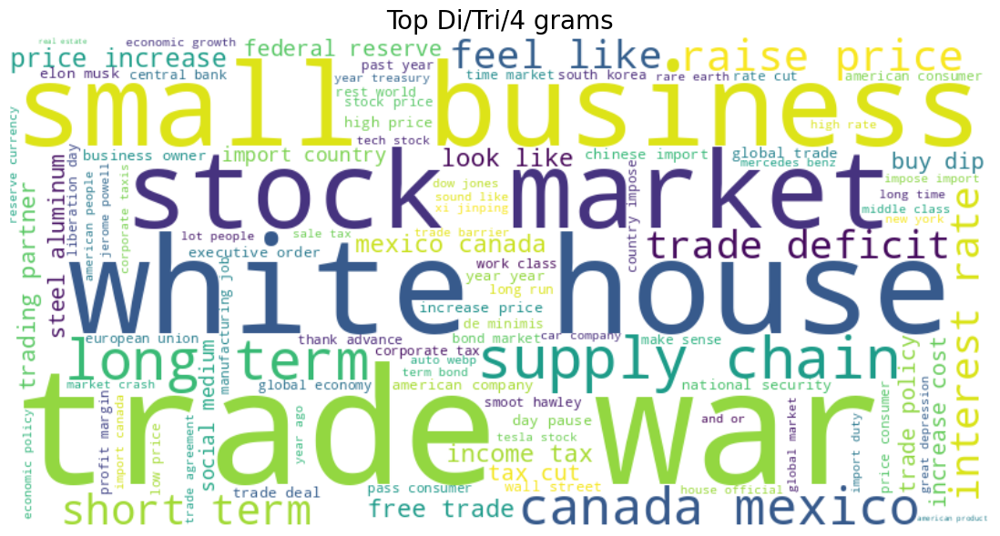

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
import pandas as pd
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Step 1: Get top digrams
def top_n_digram(df1):
    vec = CountVectorizer(ngram_range=(2, 2)).fit(df1)
    bag_of_words = vec.transform(df1)
    sum_words = bag_of_words.sum(axis=0)
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq = sorted(words_freq, key=lambda x: x[1], reverse=True)
    return words_freq

# Step 2: Plot word cloud
def wordcloud_topdigrams(digrams):
    word_freq_dict = dict(digrams[:100])  # show top 100 digrams
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_freq_dict)

    plt.figure(figsize=(15, 7))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title("Top Di/Tri/4 grams", fontsize=20)
    plt.show()

# Step 3: Run it
dict_digrams = top_n_digram(pd_combined['strings'])
wordcloud_topdigrams(dict_digrams)


In [ ]:
def top_n_digram(df1):
    vec = CountVectorizer(ngram_range = (2, 2)).fit(df1)
    bag_of_words = vec.transform(df1)
    sum_words = bag_of_words.sum(axis=0)
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq = sorted(words_freq, key = lambda x: x[1], reverse = True)
    return words_freq

def bar_plot_topdigrams(digrams):
    common_words = digrams[:20]
    df2 = pd.DataFrame(common_words, columns = ['word' , 'count'])
    fig = px.bar(df2, x = 'word', y = 'count')
    fig.update_layout(title_text = 'Top Di/Tri/4 grams', template = "plotly_white")
    fig.show()

dict_digrams = {}
dict_digrams = top_n_digram(pd_combined['strings'])
bar_plot_topdigrams(dict_digrams)

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
import pandas as pd
import plotly.express as px

def top_n_digram(df1, top_n=50):
    vec = CountVectorizer(ngram_range=(2, 2)).fit(df1)
    bag_of_words = vec.transform(df1)
    sum_words = bag_of_words.sum(axis=0)
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq = sorted(words_freq, key=lambda x: x[1], reverse=True)
    return words_freq[:top_n]  # limit to top N here

# Step 1: Collect digram counts per subreddit
all_digrams = []

for subreddit in pd_combined['subreddit'].unique():
    df_sub = pd_combined[pd_combined['subreddit'] == subreddit]

    if not df_sub['strings'].isnull().all():
        try:
            digrams = top_n_digram(df_sub['strings'].dropna())
            for word, count in digrams:
                all_digrams.append({'word': word, 'count': count, 'subreddit': subreddit})
        except Exception as e:
            print(f"Skipping {subreddit} due to error: {e}")

df_all_digrams = pd.DataFrame(all_digrams)

# Step 2: Compute total digram counts across all subreddits
total_counts = df_all_digrams.groupby('word')['count'].sum().reset_index()
total_counts.rename(columns={'count': 'total_count'}, inplace=True)

# Step 3: Merge to get total per word, compute share
df_all_digrams = df_all_digrams.merge(total_counts, on='word')
df_all_digrams['share'] = df_all_digrams['count'] / df_all_digrams['total_count']

# Step 4: Keep only top 20 digrams by overall total count
top_digrams = total_counts.sort_values(by='total_count', ascending=False).head(20)['word'].tolist()
df_top_shares = df_all_digrams[df_all_digrams['word'].isin(top_digrams)]

# Step 5: Plot stacked bar chart
fig = px.bar(df_top_shares, x='word', y='share', color='subreddit',
             title='Share of Top 20 Digrams by Subreddit',
             labels={'share': 'Share of Digram Count'},
             barmode='stack')

fig.update_layout(template="plotly_white", xaxis_tickangle=-45)
fig.show()


In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
import pandas as pd
import plotly.express as px

def top_n_digram(df1, top_n=50):
    vec = CountVectorizer(ngram_range=(3, 3)).fit(df1)
    bag_of_words = vec.transform(df1)
    sum_words = bag_of_words.sum(axis=0)
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq = sorted(words_freq, key=lambda x: x[1], reverse=True)
    return words_freq[:top_n]  # limit to top N here

# Step 1: Collect digram counts per subreddit
all_digrams = []

for subreddit in pd_combined['subreddit'].unique():
    df_sub = pd_combined[pd_combined['subreddit'] == subreddit]

    if not df_sub['strings'].isnull().all():
        try:
            digrams = top_n_digram(df_sub['strings'].dropna())
            for word, count in digrams:
                all_digrams.append({'word': word, 'count': count, 'subreddit': subreddit})
        except Exception as e:
            print(f"Skipping {subreddit} due to error: {e}")

df_all_digrams = pd.DataFrame(all_digrams)

# Step 2: Compute total digram counts across all subreddits
total_counts = df_all_digrams.groupby('word')['count'].sum().reset_index()
total_counts.rename(columns={'count': 'total_count'}, inplace=True)

# Step 3: Merge to get total per word, compute share
df_all_digrams = df_all_digrams.merge(total_counts, on='word')
df_all_digrams['share'] = df_all_digrams['count'] / df_all_digrams['total_count']

# Step 4: Keep only top 20 digrams by overall total count
top_digrams = total_counts.sort_values(by='total_count', ascending=False).head(20)['word'].tolist()
df_top_shares = df_all_digrams[df_all_digrams['word'].isin(top_digrams)]

# Step 5: Plot stacked bar chart
fig = px.bar(df_top_shares, x='word', y='share', color='subreddit',
             title='Share of Top 20 Trigrams by Subreddit',
             labels={'share': 'Share of Trigram Count'},
             barmode='stack')

fig.update_layout(template="plotly_white", xaxis_tickangle=-45)
fig.show()


In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
import pandas as pd
import plotly.express as px

def top_n_digram(df1, top_n=50):
    vec = CountVectorizer(ngram_range=(4, 4)).fit(df1)
    bag_of_words = vec.transform(df1)
    sum_words = bag_of_words.sum(axis=0)
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq = sorted(words_freq, key=lambda x: x[1], reverse=True)
    return words_freq[:top_n]  # limit to top N here

# Step 1: Collect digram counts per subreddit
all_digrams = []

for subreddit in pd_combined['subreddit'].unique():
    df_sub = pd_combined[pd_combined['subreddit'] == subreddit]

    if not df_sub['strings'].isnull().all():
        try:
            digrams = top_n_digram(df_sub['strings'].dropna())
            for word, count in digrams:
                all_digrams.append({'word': word, 'count': count, 'subreddit': subreddit})
        except Exception as e:
            print(f"Skipping {subreddit} due to error: {e}")

df_all_digrams = pd.DataFrame(all_digrams)

# Step 2: Compute total digram counts across all subreddits
total_counts = df_all_digrams.groupby('word')['count'].sum().reset_index()
total_counts.rename(columns={'count': 'total_count'}, inplace=True)

# Step 3: Merge to get total per word, compute share
df_all_digrams = df_all_digrams.merge(total_counts, on='word')
df_all_digrams['share'] = df_all_digrams['count'] / df_all_digrams['total_count']

# Step 4: Keep only top 20 digrams by overall total count
top_digrams = total_counts.sort_values(by='total_count', ascending=False).head(20)['word'].tolist()
df_top_shares = df_all_digrams[df_all_digrams['word'].isin(top_digrams)]

# Step 5: Plot stacked bar chart
fig = px.bar(df_top_shares, x='word', y='share', color='subreddit',
             title='Share of Top 20 4grams by Subreddit',
             labels={'share': 'Share of 4gram Count'},
             barmode='stack')

fig.update_layout(template="plotly_white", xaxis_tickangle=-45)
fig.show()
